# Imports

In [1]:
import numpy as np
import pandas as pd
import sqlite3
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_theme()
#from pandas_profiling import ProfileReport

In [3]:
print(pd.__version__)

1.4.1


In [3]:
pip install colorcet

Note: you may need to restart the kernel to use updated packages.


In [4]:
import colorcet as cc
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import ColumnDataSource, LogColorMapper

In [5]:
conn = sqlite3.connect("data\data_wildfire_usa.sqlite")

#conn = sqlite3.connect('FPA_FOD_20170508.sqlite') 

In [6]:
#fires = pd.read_sql_query("SELECT * FROM fires", conn)

fires est un tableau comprenant des données sur les incendies de forêt pour la période 1992-2015 compilées à partir des systèmes de déclaration fédéraux, étatiques et locaux des États-Unis.

In [7]:
#fires.info()

In [8]:
#fires.head()

# Description des variables

1.   OBJECTID : ID : donnée a priori non nécessaire pour notre étude

2.   FOD_ID : Identificateur unique global qui ressemble à l'OBJECTID 

3.   FPA_ID : Identificateur unique nécessaires pour remonter jusqu'à l'enregistrement d'origine 

4.   SOURCE_SYSTEM_TYPE : Type de données source ou système d'où provient l'enregistrement (fédéral, non fédéral ou interagence) 

5.   SOURCE_SYSTEM : Nom ou autre identifiant de la données source ou système d'où provient l'enregistrement 

6.   NWCG_REPORTING_AGENCY : Active National Wildlife Coordinating Group = Groupe national de coordination de la faune. Identifiant d'unité pour l'agence qui prépare le rapport d'incendie.
  *   BIA = Bureau of Indian Affairs 
  *   BLM = Bureau of Land Management
  *   BOR = Bureau of Reclamation
  *   DOD = Department of Defense
  *   DOE = Department of Energy
  *   FS = Forest Service
  *   FWS = Fish and Wildlife Service
  *   IA = Interagency Organization
  *   NPS = National Park Service
  *   ST/C&L = State, County, or Local Organization
  *   TRIBE = Tribal Organization

7.   NWCG_REPORTING_UNIT_ID : Identifiant d'unité NWCG actif pour l'unité préparant le rapport d'incendie 

8.   NWCG_REPORTING_UNIT_NAME : Nom d'unité NWCG actif pour l'unité préparant le rapport d'incendie

9.   SOURCE_REPORTING_UNIT : Code de l'unité d'agence préparant le rapport d'incendie, basé sur le code/nom dans les données source 

10.  SOURCE_REPORTING_UNIT_NAME : Nom de l'unité de l'agence déclarante préparant le rapport d'incendie, basé sur le code/nom des données source 

11.  LOCAL_FIRE_REPORT_ID : Numéro ou code qui identifie de manière unique un rapport d'incident pour une unité de déclaration particulière et une année civile particulière 

12.  LOCAL_INCIDENT_ID : Numéro ou code qui identifie de manière unique un incident pour une organisation locale de gestion des incendies particulière au cours d'une année civile donnée 

13.  FIRE_CODE : code utilisé au sein de la communauté inter-agences des feux de forêt pour suivre et compiler les informations sur les coûts de la suppression des incendies d'urgence

14.  FIRE_NAME : Nom de l'incident, tiré du rapport d'incendie (primaire) ou du rapport ICS-209 (secondaire)

15.  ICS_209_INCIDENT_NUMBER : Identifiant d'incident (événement), issu du rapport ICS-209. 

16.  ICS_209_NAME : Nom de l'incident, tiré du rapport ICS-209. 

17.  MTBS_ID : Identifiant d'incident, à partir de l'ensemble de données de périmètre MTBS. 

18.  MTBS_FIRE_NAME : Nom de l'incident, issu de l'ensemble de données de périmètre MTBS. 

19.  COMPLEX_NAME : Nom du complexe sous lequel l'incendie a finalement été maîtrisé, lorsqu'il est discernable. 

20.  FIRE_YEAR : Année civile au cours de laquelle l'incendie a été découvert ou confirmé. 

21.  DISCOVERY_DATE : Date à laquelle l'incendie a été découvert ou confirmé. 

22.  DISCOVERY_DOY : Jour de l'année où l'incendie a été découvert ou confirmé. 

23.  DISCOVERY_TIME : Heure de la journée à laquelle l'incendie a été découvert ou confirmé. 
            
24.  STAT_CAUSE_CODE : Code de la cause (statistique) de l'incendie.

25.  STAT_CAUSE_DESCR : Description de la cause (statistique) de l'incendie. 

26.  CONT_DATE : Date à laquelle l'incendie a été déclaré maîtrisé ou autrement maîtrisé (mm/jj/aaaa où mm=mois, jj=jour et aaaa=année). 

27.  CONT_DOY : Jour de l'année où l'incendie a été déclaré maîtrisé ou autrement maîtrisé. 

28.  CONT_TIME : Heure de la journée à laquelle l'incendie a été déclaré maîtrisé ou maîtrisé (hhmm où hh=heure, mm=minutes). *

29.  FIRE_SIZE : Estimation des acres dans le périmètre final du feu. (1 acre anglo-saxon = 40,47 ares). 

30.  FIRE_SIZE_CLASS : Code de la taille du feu basé sur le nombre d'acres dans les dépenses finales du périmètre d'incendie
  *   A = > 0 et <= 0,25 acre
  *   B = 0,26 à 9,9 acres
  *   C = 10,0 à 99,9 acres
  *   D = 100 à 299 acres
  *   E = 300 à 999 acres
  *   F = 1000 à 4999 acres
  *   G = 5000+ acres

31.  LATITUDE : Latitude (NAD83) pour l'emplacement ponctuel de l'incendie (degrés décimaux). 

32.  LONGITUDE : Longitude (NAD83) pour l'emplacement ponctuel de l'incendie (degrés décimaux). 

33.  OWNER_CODE : Code du propriétaire principal ou de l'entité responsable de la gestion du terrain au point d'origine de l'incendie au moment de l'incident.

34.  OWNER_DESCR : Nom du propriétaire principal ou de l'entité responsable de la gestion du terrain au point d'origine de l'incendie au moment de l'incident

35.  STATE : Code alphabétique à deux lettres de l'état dans lequel l'incendie a brûlé (ou s'est déclaré), basé sur la désignation nominale dans le rapport d'incendie. 

(AK=Alaska, AL=Alabama, AR=Arkansas, AZ=Arizona, CA=California, CO=Colorado, CT=Connecticut, DE=Delaware, DHS=Department of Homeland Security, DOC= Department of Commerce, DOD=Department of Defense, DOE=Department of Energy, DOI= Department of Interior, DOL=Department of Labor, FL=Florida, GA=Georgia, HI=Hawai, IA=Iowa, IA/GC=Non-Departmental Agencies, ID=Idaho, IL=Illinois, IN=Indiana, KS=Kansas, KY=Kentucky, LA=Louisiana, MA=Massachusetts, MD=Maryland, ME=Maine, MI=Michigan, MN=Minnesota, MO=Missouri, MS=Mississippi, MT=Montana, NC=North Carolina, NE=Nebraska, NG=Non-Government, NH=New Hampshire, NJ=New Jersey, NM=New Mexico, NV=Nevada, NY=New York, OH=Ohio, OK=Oklahoma, OR=Oregon, PA=Pennsylvania, PR=Puerto Rico, RI=Rhode Island, SC=South Carolina, SD=South Dakota, ST/L=State or Local Government, TN=Tennessee, Tribe=Tribe, TX=Texas, USDA=Department of Agriculture, UT=Utah, VA=Virginia, VI=U. S. Virgin Islands, VT=Vermont, WA=Washington, WI=Wisconsin, WV=West Virginia, WY=Wyoming).

36.  COUNTY : Comté, ou équivalent, dans lequel l'incendie s'est déclaré (ou a pris naissance), en fonction de la désignation nominale dans le rapport d'incendie.

37.  FIPS_CODE : Code à trois chiffres de la publication FIPS (Federal Information Process Standards) 6-4 pour la représentation des comtés et des entités équivalentes.

38.  FIPS_NAME : Nom du comté de la publication FIPS 6-4 pour la représentation des comtés et des entités équivalentes

39.  Shape : donnée inutile

# Statistiques générales

In [9]:
# Statistiques au format html
#prof = ProfileReport(fires)
#prof.to_file(output_file='rapport.html')

In [10]:
# Affichage des statistiques dans le notebook via la librairie pandas_profiling
#profile = ProfileReport(fires, title='Analyse du fichier WildFire', html={'style':{'full_width':True}})
#profile.to_notebook_iframe()

Suite à la méthode ProfileReport, nous pouvons déclarer :
- Sur 39 entrées : 14 sont des variables de tyme numérique, 24 de type catégorielle et 1 ne peut être exploitée
- Il y a 27% de valeurs manquantes dans le DataFrame
- Etant donné la part de valeurs manquantes dans les colonnes ICS_209_INCIDENT_NUMBER (98.6%), ICS_209_NAME (98.6%), MTBS_ID (99.4%), MTBS_FIRE_NAME (99.4%), COMPLEX_NAME (99.7%), ces colonnes ne seront pas utilisées pour l'étude.
- Il n'y a pas de doubons parfaits : les doublons seront à analyser en détail par colonne
- Certaines colonnes sont à haute cardinalité, c'est à dire qu'elles ont des contraintes (uniques) qui nous empêchent de les regrouper. 
- Les colonnes OBJECTID, FOD_ID et FPA_ID ont des valeurs uniques. FPA_ID a des valeurs disctintes à 99.9%, il faut analyser ce point.
- Pour certaines données, nous avons à la fois des codes et des libellés. Il faudra analyser s'il y a un lien entre ces données et si nous pouvons remplacer des valeurs manquantes.
- Certains formats de date ne sont pas lisibles

# Data Cleaning

In [11]:
# Le chargement du fichier initial est nécessaire dans cette cellule pour éviter tout message d'erreur ou mauvaise manipulation, si la cellule est ré-exécutée
fires = pd.read_sql_query("SELECT * FROM fires", conn)
# Suppression de la colonne Shape
fires = fires.drop(['Shape'], axis = 1)
# Renommage des colonnes : DAY à la place de DOY
fires = fires.rename(columns = {'DISCOVERY_DOY' : 'DISCOVERY_DAY', 'CONT_DOY' : 'CONT_DAY'})
fires.head()


,OBJECTID,FOD_ID,FPA_ID,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,SOURCE_REPORTING_UNIT,SOURCE_REPORTING_UNIT_NAME,...,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,OWNER_CODE,OWNER_DESCR,STATE,COUNTY,FIPS_CODE,FIPS_NAME
0,1,1,FS-1418826,FED,FS-FIRESTAT,FS,USCAPNF,Plumas National Forest,0511,Plumas National Forest,...,0.10,A,40.036944,-121.005833,5.0,USFS,CA,63,063,Plumas
1,2,2,FS-1418827,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,0503,Eldorado National Forest,...,0.25,A,38.933056,-120.404444,5.0,USFS,CA,61,061,Placer
2,3,3,FS-1418835,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,0503,Eldorado National Forest,...,0.10,A,38.984167,-120.735556,13.0,STATE OR PRIVATE,CA,17,017,El Dorado
3,4,4,FS-1418845,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,0503,Eldorado National Forest,...,0.10,A,38.559167,-119.913333,5.0,USFS,CA,3,003,Alpine
4,5,5,FS-1418847,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,0503,Eldorado National Forest,...,0.10,A,38.559167,-119.933056,5.0,USFS,CA,3,003,Alpine


## Examen du type/format de données

In [12]:
# Vérification de la colonne FIRE_YEAR
fires['FIRE_YEAR'].value_counts().sort_index()
# On a bien les années 1992 à 2015

1992     67975
1993     61989
1994     75955
1995     71472
1996     75574
1997     61450
1998     68370
1999     89363
2000     96416
2001     86587
2002     75656
2003     68261
2004     69279
2005     88604
2006    114004
2007     95573
2008     85378
2009     78325
2010     79889
2011     90552
2012     72769
2013     64780
2014     67753
2015     74491
Name: FIRE_YEAR, dtype: int64

In [13]:
# La colonne DISCOVERY_DATE n'est pas au bon format
# Changement du format de date de DISCOVERY_DATE
fires['DATE'] = pd.to_datetime(fires['DISCOVERY_DATE'] - pd.Timestamp(0).to_julian_date(), unit='D')
# Vérification succinte du format
print('Vérification format DATE avec la colonne FIRE_YEAR : \n', pd.DataFrame(fires['DATE']).join(fires['FIRE_YEAR']))

Vérification format DATE avec la colonne FIRE_YEAR : 
               DATE  FIRE_YEAR
0       2005-02-02       2005
1       2004-05-12       2004
2       2004-05-31       2004
3       2004-06-28       2004
4       2004-06-28       2004
...            ...        ...
1880460 2015-09-26       2015
1880461 2015-10-05       2015
1880462 2015-05-02       2015
1880463 2015-10-14       2015
1880464 2015-03-14       2015

[1880465 rows x 2 columns]


In [14]:
# La colonne CONT_DATE n'est pas au bon format et possède des valeurs manquantes
# Changement du format de date de CONT_DATE
fires['CONT_DATE_COR'] = pd.to_datetime(fires['CONT_DATE'] - pd.Timestamp(0).to_julian_date(), unit='D')
# Vérification du format
fires['CONT_DATE_COR']

0         2005-02-02
1         2004-05-12
2         2004-05-31
3         2004-07-03
4         2004-07-03
             ...    
1880460   2015-09-26
1880461          NaT
1880462          NaT
1880463          NaT
1880464          NaT
Name: CONT_DATE_COR, Length: 1880465, dtype: datetime64[ns]

In [15]:
fires[['DISCOVERY_DAY','CONT_DATE_COR']]

,DISCOVERY_DAY,CONT_DATE_COR
0,33,2005-02-02
1,133,2004-05-12
2,152,2004-05-31
3,180,2004-07-03
4,180,2004-07-03
...,...,...
1880460,269,2015-09-26
1880461,278,NaT
1880462,122,NaT
1880463,287,NaT


D'après le résulat de ProfileReport, la variable FIRE_YEAR est fortement corrélée avec les variables DISCOVERY_DATE et CONT_DATE.  
Si la variable CONT_DATE correspond à l'année de FIRE_YEAR, alors nous pouvons remplacer les 47.4% de valeurs manquantes de CONT_DATE par FIRE_YEAR

In [16]:
# On vérifie que CONT_DATE correspond à l'année de FIRE_YEAR
# Création d'une colonne et suppression des valeurs manquantes
fires['CONT_DATE_COR_INT'] = (fires['CONT_DATE_COR'].dt.year).fillna(0).astype(int)
# Différence entre CONT_DATE et FIRE_YEAR
fires['DIFF_YEAR'] = fires['CONT_DATE_COR_INT'] - fires['FIRE_YEAR']
# Vérification des différences entre les 2 colonnes
year = pd.DataFrame(fires['CONT_DATE_COR_INT']).join(fires['FIRE_YEAR']).join(fires['DIFF_YEAR'])
year.loc[(year['DIFF_YEAR']>0) & (year['DIFF_YEAR']<1992)].value_counts()


CONT_DATE_COR_INT  FIRE_YEAR  DIFF_YEAR
2011               2010       1            29
2013               2012       1            25
2015               2014       1            23
2006               2005       1            18
2008               2007       1            13
2009               2008       1            12
2003               2002       1            12
2005               2004       1             9
2002               2001       1             9
2004               2003       1             8
2000               1999       1             7
1995               1994       1             6
2007               2006       1             6
2012               2011       1             5
2009               2006       3             4
                   1999       10            4
2005               2003       2             4
1999               1998       1             4
1994               1993       1             4
2001               2000       1             3
1997               1996       1         

Au vu des écarts entre les dates, nous ne pouvons pas savoir s'il s'agit d'erreur ou bien s'il s'agit bien de l'année souhaitée.

Nous pouvons regarder la durée des feux avec les variables DATE (Date à laquelle l'incendie a été découvert) et CONT_DATE_COR (Date à laquelle l'incendie a été déclaré maîtrisé)

In [17]:
fires['DURATION'] = fires['CONT_DATE_COR'] - fires['DATE']
fires['DURATION'].value_counts().sort_values()

397 days          1
375 days          1
312 days          1
3652 days         1
368 days          1
              ...  
4 days         6772
3 days        11641
2 days        24476
1 days       104954
0 days       806199
Name: DURATION, Length: 314, dtype: int64

Nous remarquons que certains feux ont duré extrèmement longtemps,il est fort probable que ces données soient erronnées. Etant donné que nous ne savons pas si les données sont correctes, nous ne nous en préoccuperons pas. 

## Etude des variables similaires

En examinant les variables similaires, nous pouvons tenter de remplacer des valeurs manquantes par d'autres valeurs.

Est ce que la variable OBJECTID = FOD_ID ?

In [18]:
(fires.OBJECTID == fires.FOD_ID).value_counts()

False    1880393
True          72
dtype: int64

Les 2 colonnes semblent être identiques mais l'ID de FOD_ID est décalé à partir de l'index 72. 
A priori ces données ne sont pas nécessaires pour l'étude. On ne s'en préoccupera pas.

Est ce qu'une valeur donnée dans la colonne SOURCE_SYSTEM correspond à une valeur spécifique de la colonne SOURCE_SYSTEM_TYPE ?  
D'après le résultat de ProfileReport, la variable SOURCE_SYTEM_TYPE est fortement corrélée à la variable SOURCE_SYTEM. Cette dernière a 38 valeurs.

In [19]:
# Création DataFrame
source_sytem = pd.DataFrame(fires['SOURCE_SYSTEM_TYPE']).join(fires['SOURCE_SYSTEM'])
# On compte les doublons
print(source_sytem.duplicated().value_counts(), '\n')
print('On peut constater que la variable SOURCE_SYTEM a 39 valeurs et non 38')
# On regroupe les données par SOURCE_SYSTEM et on compte les valeurs de l'autre variable.
group_by_source_syst = source_sytem.groupby(['SOURCE_SYSTEM'], as_index = False).value_counts()
print('Résultat :')
group_by_source_syst

True     1880426
False         39
dtype: int64 

On peut constater que la variable SOURCE_SYTEM a 39 valeurs et non 38
Résultat :


,SOURCE_SYSTEM,SOURCE_SYSTEM_TYPE,count
0,DOI-WFMI,FED,241423
1,FA-NFIRS,NONFED,3387
2,FS-FIRESTAT,FED,220356
3,FWS-FMIS,FED,19327
4,IA-AKACC,INTERAGCY,3713
5,IA-HIWMO,INTERAGCY,9714
6,IA-ICS209,INTERAGCY,1982
7,IA-ICS209,NONFED,1
8,IA-PRIITF,INTERAGCY,21802
9,ST-ALALS,NONFED,54951


Nous remarquons que la donnée IA-ICS209 est en double et nous pouvons émettre l'hypothèse que certaines données peuvent être mal orthographiées.

Est ce qu'une valeur donnée dans la colonne NWCG_REPORTING_UNIT_ID correspond à une valeur spécifique de la colonne NWCG_REPORTING_UNIT_NAME ?  
D'après le résultat de ProfileReport, la variable NWCG_REPORTING_UNIT_ID est fortement corrélée à la variable NWCG_REPORTING_UNIT_NAME. Elles ont respectivement 1640 et 1635 valeurs.  
On en conclue qu'une valeur ID ne correspond pas a une seule valeur NAME

In [20]:
# Création DataFrame
reporting = pd.DataFrame(fires['NWCG_REPORTING_UNIT_ID']).join(fires['NWCG_REPORTING_UNIT_NAME'])
# On regroupe les données par NWCG_REPORTING_UNIT_ID puis on compte les valeurs de l'autre variable.
group_by_reporting = reporting.groupby(['NWCG_REPORTING_UNIT_ID'], as_index = False).value_counts()


In [21]:
# On s'intéresse aux doublons de NWCG_REPORTING_UNIT_NAME
reporting_doublon = group_by_reporting[group_by_reporting['NWCG_REPORTING_UNIT_NAME'].duplicated(keep = False) == True].sort_values(by ='NWCG_REPORTING_UNIT_NAME')
reporting_doublon

,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,count
319,USCOCUX,Custer County,8
1241,USSDCUX,Custer County,4
327,USCODGX,Douglas County,226
1248,USSDDOX,Douglas County,8
392,USCOJCX,Jackson County,22
1300,USSDJAX,Jackson County,1
406,USCOLOX,Logan County,9
679,USKSLGX,Logan County,1
313,USCOCRD,Northwest District,5182
364,USCOGJD,Northwest District,3781


Si NWCG_REPORTING_UNIT_NAME a des doublons il s'agit probablement d'une erreur dans le jeu de données ou d'un changement de code (dans le référentiel) en cours d'année.  
Pour une question d'homogénéité, nous pouvons remplacer ces données par celles qui sont les plus utilisées.

In [22]:
# Remplacement des valeurs doublons
fires['NWCG_REPORTING_UNIT_ID'] = fires['NWCG_REPORTING_UNIT_ID'].replace(['USSDCUX', 'USSDDOX', 'USSDJAX', 'USKSLGX', 'USCOGJD'],['USCOCUX', 'USCODGX', 'USCOJCX', 'USCOLOX', 'USCOCRD'])

D'après le résultat de ProfileReport, Les variables FIRE_CODE et FIRE_NAME sont à haute cardinalité et ont respectivement 82.7% et 50.9% de valeurs manquantes.  
Est ce qu'une valeur donnée dans la colonne FIRE_CODE correspond à une valeur spécifique de la colonne FIRE_NAME ?

In [23]:
# Création DataFrame
fires_code_name = pd.DataFrame(fires['FIRE_CODE']).join(fires['FIRE_NAME'])
# On compte les doublons
print(fires_code_name.duplicated().value_counts(), '\n')
# On regroupe les données par FIRE_NAME et on compte les valeurs de l'autre variable.
group_by = fires_code_name.groupby(['FIRE_NAME'], as_index = False).value_counts()
group_by[group_by['count'] > 1].sort_values(by = 'FIRE_NAME')


True     1187560
False     692905
dtype: int64 



,FIRE_NAME,FIRE_CODE,count
858,0118,EK2A,2
1276,0183,EK2A,2
1535,0227,EK2A,2
1679,0250,EK2A,2
1685,0251,EK2A,2
...,...,...,...
312284,ZOT,DZ9H,2
312282,ZOT,EK15,5
312285,ZOT,6300,2
312304,ZULU,EKT1,2


Il en résulte qu'un code ne correspond pas systématiquement à un seul nom de feu. Un même code peut posséder plusieurs noms et inversement.  

Est ce qu'une valeur donnée dans la colonne SOURCE_REPORTING_UNIT correspond à une valeur spécifique de la colonne SOURCE_REPORTING_UNIT_NAME ?

In [24]:
# Création DataFrame
source_reporting = pd.DataFrame(fires['SOURCE_REPORTING_UNIT']).join(fires['SOURCE_REPORTING_UNIT_NAME'])
# On compte les doublons
print(source_reporting.duplicated().value_counts(), '\n')
# On regroupe les données
group_by_source_reporting = source_reporting.groupby(['SOURCE_REPORTING_UNIT'], as_index = False).value_counts().sort_values(by = 'SOURCE_REPORTING_UNIT')

True     1873584
False       6881
dtype: int64 



In [25]:
# On s'intéresse aux doublons
source_reporting_doublon = group_by_source_reporting[group_by_source_reporting['SOURCE_REPORTING_UNIT_NAME'].duplicated() == True].sort_values(by ='SOURCE_REPORTING_UNIT_NAME')
source_reporting_doublon


,SOURCE_REPORTING_UNIT,SOURCE_REPORTING_UNIT_NAME,count
6523,USMNAGR,AGASSIZ NWR,2
6469,USCOALR,ALAMOSA NWR,1
6545,USNCALR,ALLIGATOR RIV NWR,8
6602,USTXAHR,ANAHUAC NWR,10
6603,USTXARR,ARANSAS NWR,1
...,...,...,...
6803,WI Wisconsin Rapids,Wisconsin Rapids District,1133
6804,WI Woodruff,Woodruff District,917
6878,WYWYS,Wyoming State Forestry,2143
6438,USAKYDR,YUKON DELTA NWR,20


Pour cette variable également on s'aperçoit qu'un code ne correspond pas à un seul nom et inversement.

In [26]:
# Pour limiter les doublons, nous allons convertir les données de SOURCE_REPORTING_UNIT_NAME en majuscule
fires["SOURCE_REPORTING_UNIT_NAME"] = fires["SOURCE_REPORTING_UNIT_NAME"].str.upper()

Est ce qu'une valeur donnée dans la colonne STAT_CAUSE_CODE correspond à une valeur spécifique de la colonne STAT_CAUSE_DESCR ?

In [27]:
# Création DataFrame
stat_cause = pd.DataFrame(fires['STAT_CAUSE_CODE']).join(fires['STAT_CAUSE_DESCR'])
# On compte les doublons
print(stat_cause.duplicated().value_counts(), '\n')
# On regroupe les données
group_by_stat = stat_cause.groupby(['STAT_CAUSE_CODE'], as_index = False).value_counts()
group_by_stat

True     1880452
False         13
dtype: int64 



,STAT_CAUSE_CODE,STAT_CAUSE_DESCR,count
0,1.0,Lightning,278468
1,2.0,Equipment Use,147612
2,3.0,Smoking,52869
3,4.0,Campfire,76139
4,5.0,Debris Burning,429028
5,6.0,Railroad,33455
6,7.0,Arson,281455
7,8.0,Children,61167
8,9.0,Miscellaneous,323805
9,10.0,Fireworks,11500


La variable STAT_CAUSE_CODE correspond à une donnée de STAT_CAUSE_DESCR

Est ce qu'une valeur donnée dans la colonne OWNER_CODE correspond à une valeur spécifique de la colonne OWNER_DESCR ?

In [28]:
# Création DataFrame
owner = pd.DataFrame(fires['OWNER_CODE']).join(fires['OWNER_DESCR'])
# On compte les doublons
print(owner.duplicated().value_counts(), '\n')
# On regroupe les données
group_by_owner = owner.groupby(['OWNER_CODE'], as_index = False).value_counts()
group_by_owner

True     1880449
False         16
dtype: int64 



,OWNER_CODE,OWNER_DESCR,count
0,0.0,FOREIGN,15
1,1.0,BLM,63278
2,2.0,BIA,106819
3,3.0,NPS,17524
4,4.0,FWS,12191
5,5.0,USFS,188338
6,6.0,OTHER FEDERAL,6452
7,7.0,STATE,30790
8,8.0,PRIVATE,314822
9,9.0,TRIBAL,8952


La variable OWNER_CODE correspond à une donnée de OWNER_DESCR

Est ce qu'une valeur donnée dans la colonne FIPS_CODE correspond à une valeur spécifique de la colonne FIPS_NAME ?

In [29]:
# Création DataFrame
fips = pd.DataFrame(fires['FIPS_CODE']).join(fires['FIPS_NAME'])
# On compte les doublons
print(fips.duplicated().value_counts(), '\n')
# On regroupe les données
group_by_fips = fips.groupby(['FIPS_CODE'], as_index = False).value_counts()
group_by_fips

True     1877769
False       2696
dtype: int64 



,FIPS_CODE,FIPS_NAME,count
0,001,Atlantic,3237
1,001,Adair,2828
2,001,Albany,2395
3,001,Adams,2140
4,001,Anderson,2080
...,...,...,...
2690,730,Petersburg City,2
2691,760,Richmond (city),1
2692,800,Suffolk City,49
2693,810,Virginia Beach City,17


Pour cette variable, on s'aperçoit qu'un code ne correspond pas à un seul nom et inversement.

Nous pouvons vérifier si la variable FIRE_SIZE_CLASS correspond à la variable FIRE_SIZE

In [30]:
# Création d'une colonne
fires['FIRE_SIZE_CLASS_TEST'] = 0
# Création d'une liste de condition
conditionlist = [
    (fires['FIRE_SIZE'] <= 0.25),
    (fires['FIRE_SIZE'] >0.25) & (fires['FIRE_SIZE']<10),
    (fires['FIRE_SIZE'] >=10) & (fires['FIRE_SIZE'] <100),
    (fires['FIRE_SIZE'] >=100) & (fires['FIRE_SIZE'] <300),
    (fires['FIRE_SIZE'] >=300) & (fires['FIRE_SIZE'] <1000),
    (fires['FIRE_SIZE'] >=1000) & (fires['FIRE_SIZE'] <5000),
    (fires['FIRE_SIZE']>=5000)]

# Création d'une liste de choix
choicelist = ['A', 'B', 'C', 'D', 'E', 'F', 'G']

# Comparaison avec la colonne existante
fires['FIRE_SIZE_CLASS_TEST'] = np.select(conditionlist, choicelist)
(fires['FIRE_SIZE_CLASS_TEST'] == fires['FIRE_SIZE_CLASS']).value_counts()


True    1880465
dtype: int64

La colonne FIRE_SIZE_CLASS est conforme à la colonne FIRE_SIZE

## Examen des doublons

L'examen des doublons sur l'ensemble des colonnes du DataFrame peut se faire directement avec les résulats de ProfileReport.  
Cependant, pour plus de clareté nous allons détailler certains points

In [31]:
# Création d'un dictionnaire regroupant les colonnes et le nombre de doublons par colonne
doublons = {}
for col in fires.columns :
    duplicates = fires[col].duplicated().sum()
    doublons[col] = duplicates

doublons

{'OBJECTID': 0,
 'FOD_ID': 0,
 'FPA_ID': 3,
 'SOURCE_SYSTEM_TYPE': 1880462,
 'SOURCE_SYSTEM': 1880427,
 'NWCG_REPORTING_AGENCY': 1880454,
 'NWCG_REPORTING_UNIT_ID': 1878830,
 'NWCG_REPORTING_UNIT_NAME': 1878830,
 'SOURCE_REPORTING_UNIT': 1875473,
 'SOURCE_REPORTING_UNIT_NAME': 1876258,
 'LOCAL_FIRE_REPORT_ID': 1866956,
 'LOCAL_INCIDENT_ID': 1314550,
 'FIRE_CODE': 1708018,
 'FIRE_NAME': 1386831,
 'ICS_209_INCIDENT_NUMBER': 1857727,
 'ICS_209_NAME': 1860891,
 'MTBS_ID': 1869983,
 'MTBS_FIRE_NAME': 1872331,
 'COMPLEX_NAME': 1879048,
 'FIRE_YEAR': 1880441,
 'DISCOVERY_DATE': 1871699,
 'DISCOVERY_DAY': 1880099,
 'DISCOVERY_TIME': 1879024,
 'STAT_CAUSE_CODE': 1880452,
 'STAT_CAUSE_DESCR': 1880452,
 'CONT_DATE': 1871704,
 'CONT_DAY': 1880098,
 'CONT_TIME': 1879023,
 'FIRE_SIZE': 1866828,
 'FIRE_SIZE_CLASS': 1880458,
 'LATITUDE': 986404,
 'LONGITUDE': 882929,
 'OWNER_CODE': 1880449,
 'OWNER_DESCR': 1880449,
 'STATE': 1880413,
 'COUNTY': 1877009,
 'FIPS_CODE': 1880179,
 'FIPS_NAME': 1878766,
 '

Le résultat de ce dictionnaire nous indique plusieurs choses :
1. Pour la plupart des variables, il n'existe que très peu de données distinctes car il y a beaucoup de doublons.
2. Pour les variables uniques :
    - telles que OBJECTID et FOD_ID, il n'existe pas de doublons. Il n'y a donc pas d'erreur dans ces données car elles sont uniques (en lien avec les résultats de la méthode ProfileReport).
    - En revanche, pour la variable FPA_ID, nous remarquons qu'il y a 3 doublons. Ces erreurs doivent être corrigées car FPA_ID est une donnée censée être unique 

In [32]:
# Identification et correction des doublons de FPA_ID
fpa_doublon = fires[fires['FPA_ID'].duplicated(keep = False) == True]
fpa_doublon


,OBJECTID,FOD_ID,FPA_ID,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,SOURCE_REPORTING_UNIT,SOURCE_REPORTING_UNIT_NAME,...,STATE,COUNTY,FIPS_CODE,FIPS_NAME,DATE,CONT_DATE_COR,CONT_DATE_COR_INT,DIFF_YEAR,DURATION,FIRE_SIZE_CLASS_TEST
21986,21987,22093,FS-1452833,FED,FS-FIRESTAT,FS,USNMCIF,Cibola National Forest,0303,CIBOLA NATIONAL FOREST,...,NM,31,031,McKinley,2007-07-18,2007-07-26,2007,0,8 days,B
1065673,1065674,1300088,ICS209_2009_KS-DDQ-128,INTERAGCY,IA-ICS209,DOD,USKSFRQ,Fort Riley Kansas,KSDDQ,FORT RILEY,...,KS,Riley,161,Riley,2009-02-19,2009-02-19,2009,0,0 days,F
1565829,1565830,201432072,FS-1452833,FED,FS-FIRESTAT,FS,USNMCIF,Cibola National Forest,0303,CIBOLA NATIONAL FOREST,...,NM,031,031,McKinley,2012-07-03,2012-07-04,2012,0,1 days,A
1634979,1634980,201750002,ICS209_2009_KS-DDQ-128,INTERAGCY,IA-ICS209,DOD,USKSFRQ,Fort Riley Kansas,KSDDQ,FORT RILEY,...,KS,Riley,161,Riley,2012-03-04,2012-04-03,2012,0,30 days,F
1825692,1825693,300245030,SFO-2015CACDFLNU003791,NONFED,ST-NASF,ST/C&L,USCALNU,Sonoma-Lake Napa Unit,CALNU,SONOMA-LAKE NAPA UNIT,...,CA,SONOMA,097,Sonoma,2015-05-12,2015-05-12,2015,0,0 days,B
1870332,1870333,300306586,SFO-2015CACDFLNU003791,NONFED,ST-NASF,ST/C&L,USCALNU,Sonoma-Lake Napa Unit,CALNU,SONOMA-LAKE NAPA UNIT,...,CA,SOLANO,095,Solano,2015-07-01,NaT,0,-2015,NaT,A


Les 3 doublons concernent les FPA_ID suivants : FS-1452833 ; ICS209_2009_KS-DDQ-128 et SFO-2015CACDFLNU003791

In [33]:
# Examen des doublons
fpa_doublon.sort_values(by = 'FPA_ID', inplace = True)
for col in fpa_doublon.columns :
    if any(fpa_doublon.groupby(['FPA_ID'])[col].nunique()>1)  :
        print(fpa_doublon[['FPA_ID', col]])
        print('='*50)

C:\Users\Enedis\AppData\Local\Temp\ipykernel_512\4047107341.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fpa_doublon.sort_values(by = 'FPA_ID', inplace = True)


                         FPA_ID  OBJECTID
21986                FS-1452833     21987
1565829              FS-1452833   1565830
1065673  ICS209_2009_KS-DDQ-128   1065674
1634979  ICS209_2009_KS-DDQ-128   1634980
1825692  SFO-2015CACDFLNU003791   1825693
1870332  SFO-2015CACDFLNU003791   1870333
                         FPA_ID     FOD_ID
21986                FS-1452833      22093
1565829              FS-1452833  201432072
1065673  ICS209_2009_KS-DDQ-128    1300088
1634979  ICS209_2009_KS-DDQ-128  201750002
1825692  SFO-2015CACDFLNU003791  300245030
1870332  SFO-2015CACDFLNU003791  300306586
                         FPA_ID LOCAL_FIRE_REPORT_ID
21986                FS-1452833                   46
1565829              FS-1452833                  040
1065673  ICS209_2009_KS-DDQ-128                 None
1634979  ICS209_2009_KS-DDQ-128                 None
1825692  SFO-2015CACDFLNU003791                 None
1870332  SFO-2015CACDFLNU003791                 None
                         FPA_ID LO

Au vu du nombre de donnée en doublon, nous pouvons supprimer les données qu'on ne peut pas expliquer ou bien les laisser car 3 doublons sur 1800000 observation ont peu d'impact.

# Examen des causes des feux de forêt

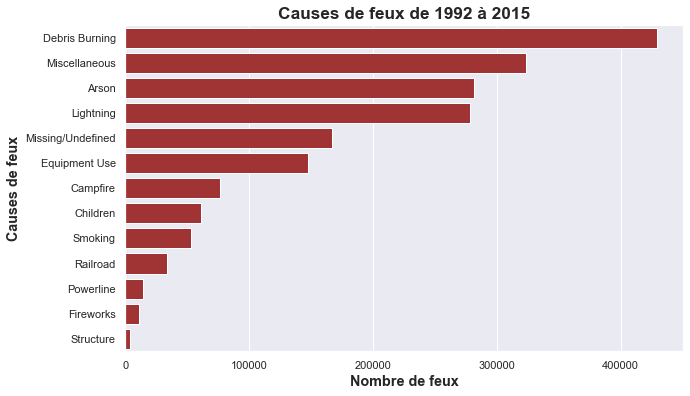

In [34]:
# Création d'un graphique en barre pour connaitre le nombre de causes de feux de 1992 à 2015
sns.set({"figure.figsize":(10, 6)})
sns.countplot(y='STAT_CAUSE_DESCR', data = fires, order= fires['STAT_CAUSE_DESCR'].value_counts().index, color = 'firebrick')
plt.xlabel('Nombre de feux', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Causes de feux', fontweight = 'bold', fontsize = 'large')
plt.title('Causes de feux de 1992 à 2015', fontsize = 'x-large', fontweight = 'bold')
plt.show()


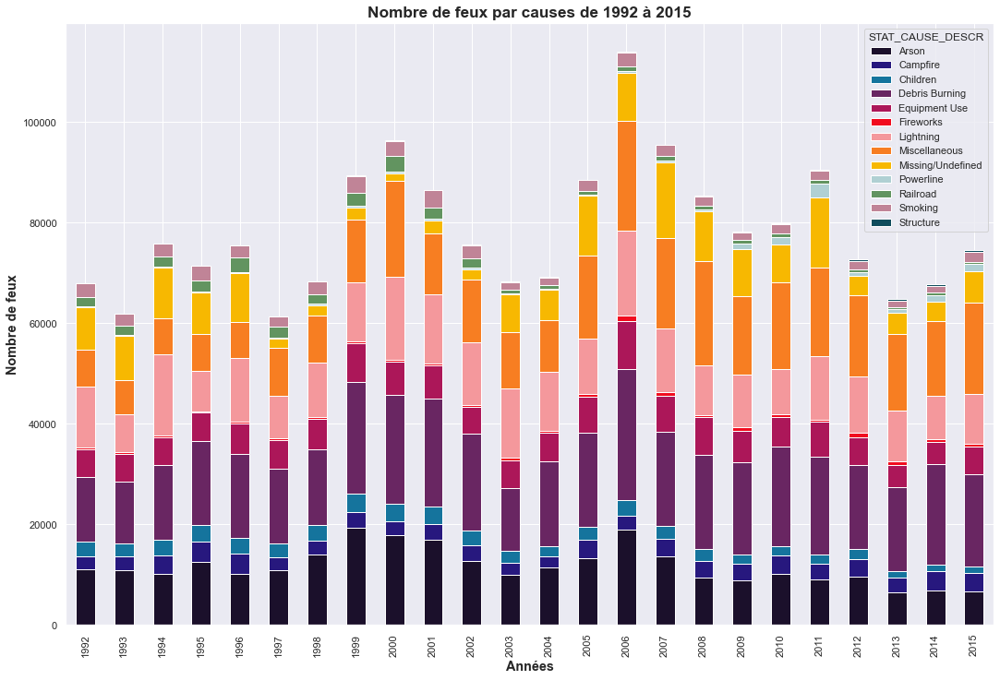

In [35]:
# Création d'un graphique montrant la répartition des causes de feux de 1992 à 2015
cross_cause = pd.crosstab(index = fires.FIRE_YEAR, columns = fires.STAT_CAUSE_DESCR).reset_index()

sns.set({"figure.figsize":(18, 12)})
cross_cause.plot.bar(x = 'FIRE_YEAR', 
    y = ['Arson', 'Campfire', 'Children',	'Debris Burning', 'Equipment Use', 'Fireworks', 'Lightning', 'Miscellaneous', 'Missing/Undefined', 'Powerline', 'Railroad', 'Smoking', 'Structure'],
    stacked = True,
    color = ['#1B102B','#27187E','#15749D','#692662','#AC1759','#F10C1F','#F4989C','#F77E22', '#F7B801', '#B0D0D3', '#629460', '#C08497', '#0F4C5C'])
plt.xlabel('Années', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Nombre de feux', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux par causes de 1992 à 2015', fontsize = 'x-large', fontweight = 'bold')
plt.show()

Il y a 13 causes de feu répertoriées dans le dataset.

Voici le top 5 des causes de feu de forêt aux Etats-Unis entre 1992 et 2015 :
- Débris brûlant (22%)
- Divers (17.2%)
- Incendie criminel (15%)
- Eclair (14.8%)
- Données manquantes / non identifiées (8.9%)

Nous remarqons que la 2ème cause de feu appartient à la catégorie divers (on ne sait pas trop à quoi cela correspond) et la 5ème cause appartient à la catégorie données manquantes/non identifiées. Cela signifie qu'une grande partie de ces feux ne peut être expliquée.

##### Cause/Nb de feux vs Année

Nous pouvons regarder quelles ont été les années les plus marquées par les feux de forêt

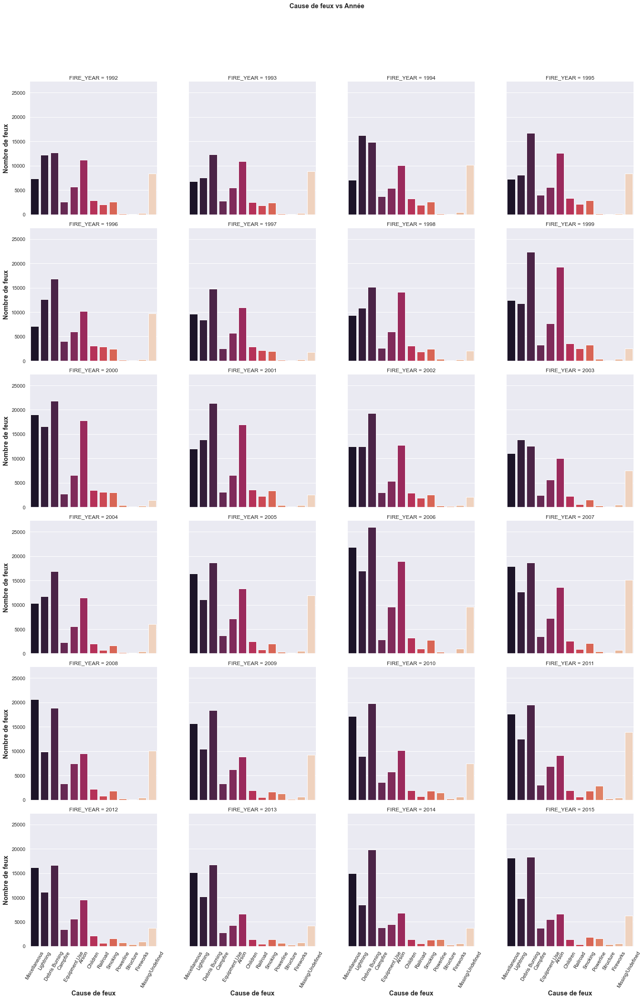

In [36]:
# Création de plusieurs graphiques pour connaitre la cause de feux par années et par causes de feux
g=sns.catplot(x='STAT_CAUSE_DESCR', col='FIRE_YEAR', kind='count',  palette = 'rocket', col_wrap=4, data = fires);
g.set_xticklabels(rotation=60); 

g.set_xlabels('Cause de feux', fontweight = 'bold', fontsize = 'large')
g.set_ylabels('Nombre de feux', fontweight = 'bold', fontsize = 'large')
g.fig.subplots_adjust(top=0.9) # adjust the Figure in g
g.fig.suptitle('Cause de feux vs Année', fontweight = 'bold', fontsize = 'large');

Nous constatons que la cause de feu la plus répandue est 'débris brûlant' avec des pics dépassant le nombre de 200 000 feux spécialement en 1999, 2000, 2001 et 2006. Les 2 autres causes principales sont la catégorie 'divers' et 'éclair'.

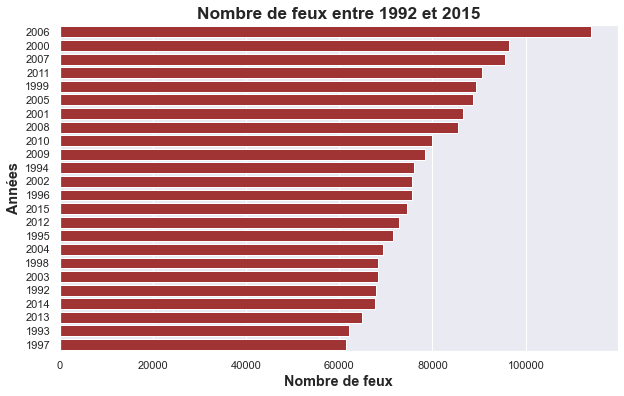

In [37]:
# Création d'un graphique en barre pour connaitre le nombre de feux par années entre 1992 et 2015
sns.set({"figure.figsize":(10, 6)})
sns.countplot(y='FIRE_YEAR', data = fires, order= fires['FIRE_YEAR'].value_counts().index, color = 'firebrick')
plt.xlabel('Nombre de feux', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Années', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux entre 1992 et 2015', fontsize = 'x-large', fontweight = 'bold')
plt.show()

Avec ces graphiques, nous remarquons que l'année 2006 est nettement devant les autres années, suivie de l'année 2000 et 2007.  
Il est intéressant de comprendre pourquoi le nombre de feux est plus important durant l'année 2006.  

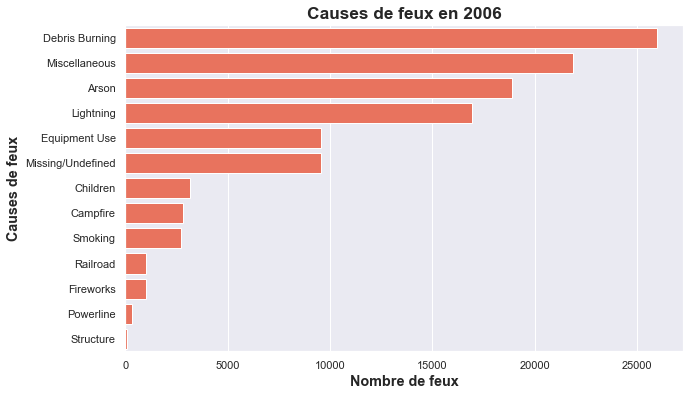

In [38]:
# Création d'un DataFrame uniquement pour l'année 2006
fires_analysis_2006 = fires[fires['FIRE_YEAR']==2006]
fires_analysis_2006['STAT_CAUSE_DESCR'].value_counts()

# Création d'un graphique en barre montrant les causes de feux en 2006
sns.set({"figure.figsize":(10, 6)})
sns.countplot(y='STAT_CAUSE_DESCR', data = fires_analysis_2006, order= fires_analysis_2006['STAT_CAUSE_DESCR'].value_counts().index, color = 'tomato')
plt.xlabel('Nombre de feux', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Causes de feux', fontweight = 'bold', fontsize = 'large')
plt.title('Causes de feux en 2006', fontsize = 'x-large', fontweight = 'bold')
plt.show()

On peut s'apercevoir que les causes les plus répandues en 2006 sont les débris brûlants, puis les causes diverses ainsi que les incendies criminels.  
C'est le même classement que pour l'ensemble du périmètre 1992 à 2015.  
On s'intéressera aux Etats et aux températures prochainement. A présent, nous allons regarder durant quels mois les feux de forêt de 2006 ont été 

### Cause/Nb de feux vs Mois

A quel moment de l'année les feux de forêt sont-ils les plus probables ?

In [39]:
# Création des colonnes mois et jour
# La colonne mois correspond aux mois où les feux ont été découvert
fires['MONTH'] = pd.DatetimeIndex(fires['DATE']).month_name()
# La colonne jour correspond aux jours de la semaine où les feux ont été découvert
fires['DAY'] = fires['DATE'].dt.day_name()


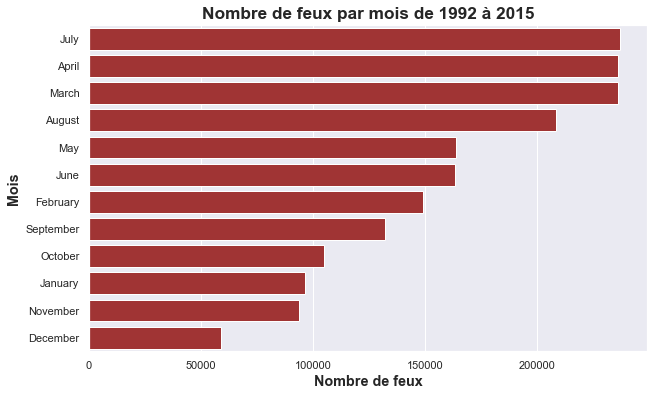

In [40]:
# Création d'un graphique en barre pour connaitre le nombre de de feux par mois de 1992 à 2015
sns.set({"figure.figsize":(10, 6)})
sns.countplot(y='MONTH', data = fires, order= fires['MONTH'].value_counts().index, color = 'firebrick')
plt.xlabel('Nombre de feux', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Mois', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux par mois de 1992 à 2015', fontsize = 'x-large', fontweight = 'bold')
plt.show()

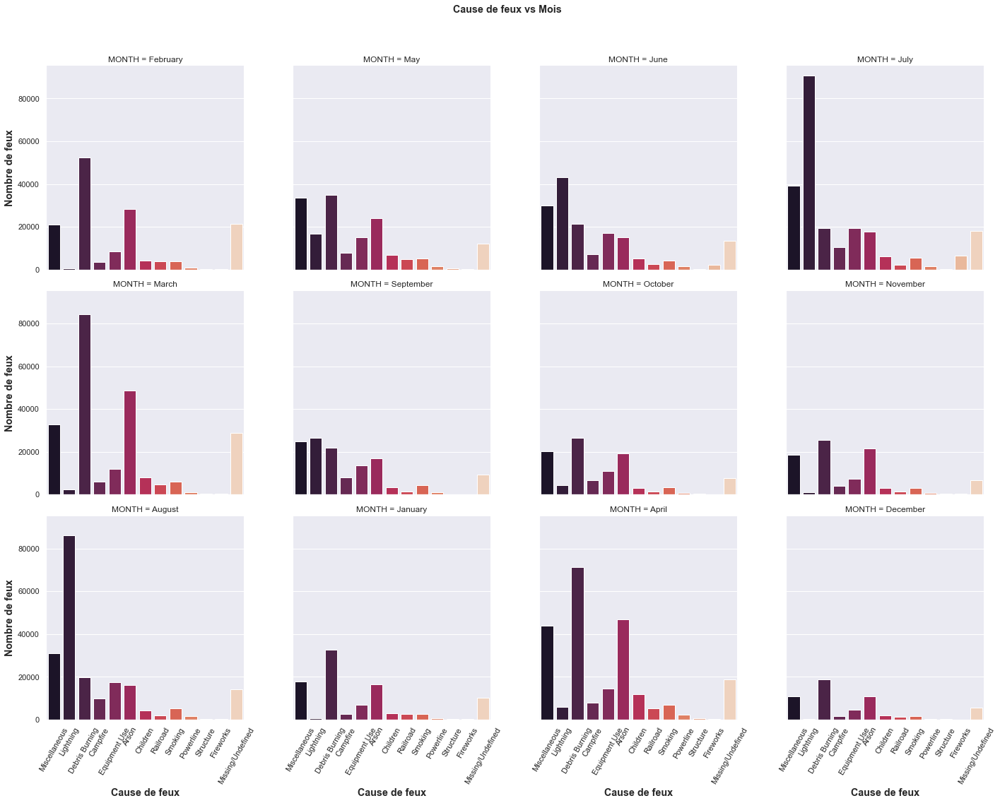

In [41]:
# Création de plusieurs graphiques pour connaitre la cause de feux par années et par causes de feux
g=sns.catplot(x='STAT_CAUSE_DESCR', col='MONTH', kind='count',  palette = 'rocket', col_wrap=4, data = fires);
g.set_xticklabels(rotation=60); 

g.set_xlabels('Cause de feux', fontweight = 'bold', fontsize = 'large')
g.set_ylabels('Nombre de feux', fontweight = 'bold', fontsize = 'large')
g.fig.subplots_adjust(top=0.9) # adjust the Figure in g
g.fig.suptitle('Cause de feux vs Mois', fontweight = 'bold', fontsize = 'large');

Les mois où les feux de forêt sont les plus présents sont les mois de juillet, avril et mars sur toute la période d'observation.  

Pour juillet la cause principale sont les éclairs qui sont très loin devant les feux d'artifices.    
En avril et en mars cela s'explique principalement par les débris brûlants.  
Il est intéressant de souligner qu'en aout les éclairs sont aussi la principale causes de feux de forêt.

Etant donné le nombre important de feux en juillet, nous pouvons nous interroger sur la date du 4 juillet qui correspond à la fête nationale des États-Unis commémorant la Déclaration d'indépendance.  
Nous pouvons imaginer que pendant cette journée, les individus utilise des feux d'artifice et causent des incendies.

#### Zoom sur le 4 juillet

In [42]:
# Etude sur les feux ayant été découverts le 04/07 de chaque année. Pour cela, prenons la variable 'DATE' qui correspond à la date de découverte des feux.
# Création de colonnes avec uniquement les mois et les jours
fires['SPLIT_MONTH'] = fires['DATE'].dt.month
fires['SPLIT_DAY'] = fires['DATE'].dt.day

# Création d'un DataFrame avec uniquement les données datant du 4 juillet de chaque année
fires_independance = fires[(fires['SPLIT_MONTH'] == 7) & (fires['SPLIT_DAY'] == 4)]
print('Il y a', len(fires_independance), 'observations dans le Dataset pour le 4 juillet de chaque année')

Il y a 14363 observations dans le Dataset pour le 4 juillet de chaque année


### Création de graphiques 

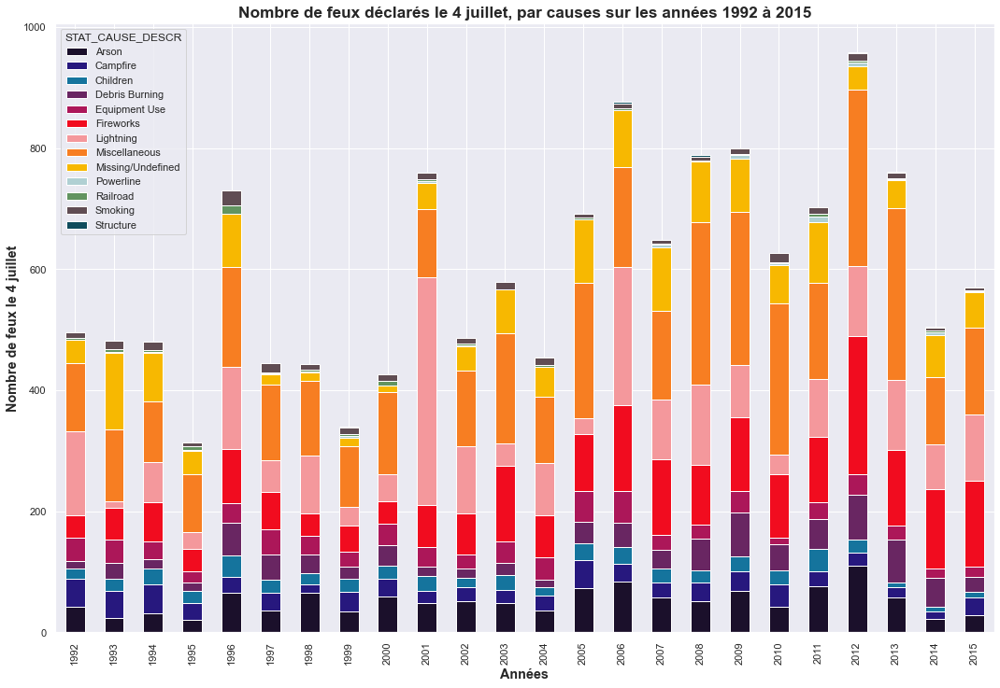

In [43]:
# Graphique montrant le nombre de feux le 4 juillet, par causes et par année
cross_cause_independance = pd.crosstab(index = fires_independance.FIRE_YEAR, columns = fires_independance.STAT_CAUSE_DESCR).reset_index()

sns.set({"figure.figsize":(18, 12)})
cross_cause_independance.plot.bar(x = 'FIRE_YEAR', 
    y = ['Arson', 'Campfire', 'Children',	'Debris Burning', 'Equipment Use', 'Fireworks', 'Lightning', 'Miscellaneous', 'Missing/Undefined', 'Powerline', 'Railroad', 'Smoking', 'Structure'],
    stacked = True, 
    color = ['#1B102B','#27187E','#15749D','#692662','#AC1759','#F10C1F','#F4989C','#F77E22', '#F7B801', '#B0D0D3', '#629460', '#604D53', '#0F4C5C'])
plt.xlabel('Années', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Nombre de feux le 4 juillet', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux déclarés le 4 juillet, par causes sur les années 1992 à 2015', fontsize = 'x-large', fontweight = 'bold')
plt.show()

Nous remarquons que le 4 juillet, les feux d'artifices ne sont pas la seule cause principale de feux. Les catégories 'éclairs' et 'divers' sont fortement présentes. En sachant que nous ne savons pas exactement à quoi correspond la catégorie divers. On peut supposer que dans cette catégorie sont recensées également des causes d'incendie par feux d'artifice.

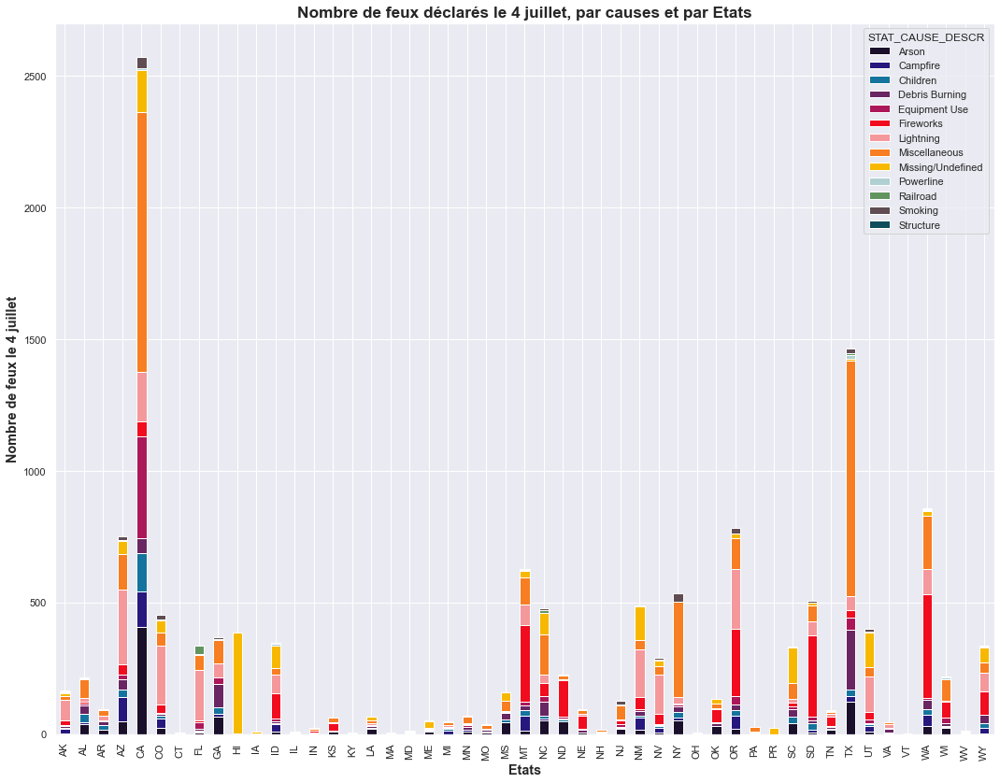

In [44]:
# Graphique montrant le nombre de feux le 4 juillet, par causes et par Etat
cross_cause_independance = pd.crosstab(index = fires_independance.STATE, columns = fires_independance.STAT_CAUSE_DESCR).reset_index()

sns.set({"figure.figsize":(18, 14)})
cross_cause_independance.plot.bar(x = 'STATE', 
    y = ['Arson', 'Campfire', 'Children',	'Debris Burning', 'Equipment Use', 'Fireworks', 'Lightning', 'Miscellaneous', 'Missing/Undefined', 'Powerline', 'Railroad', 'Smoking', 'Structure'],
    stacked = True,
    color = ['#1B102B','#27187E','#15749D','#692662','#AC1759','#F10C1F','#F4989C','#F77E22', '#F7B801', '#B0D0D3', '#629460', '#604D53', '#0F4C5C'])
plt.xlabel('Etats', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Nombre de feux le 4 juillet', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux déclarés le 4 juillet, par causes et par Etats', fontsize = 'x-large', fontweight = 'bold')
plt.show()

D'après ce graphique, nous constatons que les feux d'artifice ne sont pas la principale cause de feux  dans tous les Etats-Unis, le 4 juillet de 1992 à 2015.  
Les Etats pour lesquels le feux d'artifice est la principale cause de feux de forêt sont Washington (WA), Dakota du Dud (SD), Montana (MT) et l'Oregon (OR).

Ce qui est intéressant dans ce graphique, c'est le nombre de feux en Californie le 4 juillet, qui dépasse largement les autres Etats. De plus, la principale cause de feux est la catégorie divers et les feux d'artifices ne représentent qu'un petit nombre des feux au total.

##### Cause/Nb de feux vs jour de la semaine

A quel moment de la semaine les feux de forêt sont-ils les plus probables ?

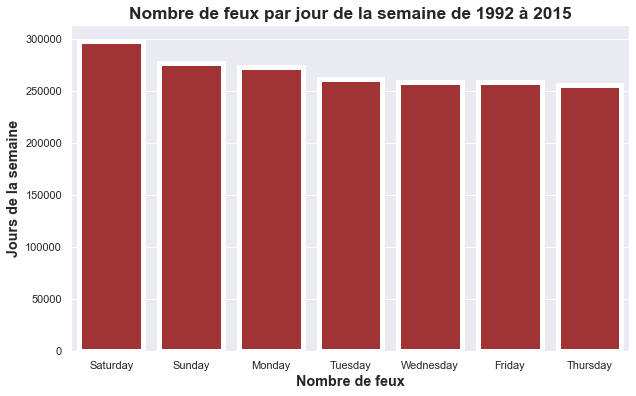

In [45]:
# Création d'un graphique en barre pour connaitre le nombre de de feux par jour de la semaine de 1992 à 2015
sns.set({"figure.figsize":(10, 6)})

sns.countplot(x='DAY', data = fires, order= fires['DAY'].value_counts().index, color = 'firebrick', linewidth = 5)
plt.xlabel('Nombre de feux', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Jours de la semaine', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux par jour de la semaine de 1992 à 2015', fontsize = 'x-large', fontweight = 'bold')
plt.show()

Visiblement, les feux de forêt sont plus nombreux le samedi puis ensuite le dimanche et lundi.  

On peut supposer que les feux de forêts sont déclenchés par des personnes négligentes : feux de camp, cigarettes, incendies malveillants.  

Il est peu probable que les incendies apparaissant le week-end proviennent de causes naturelles.

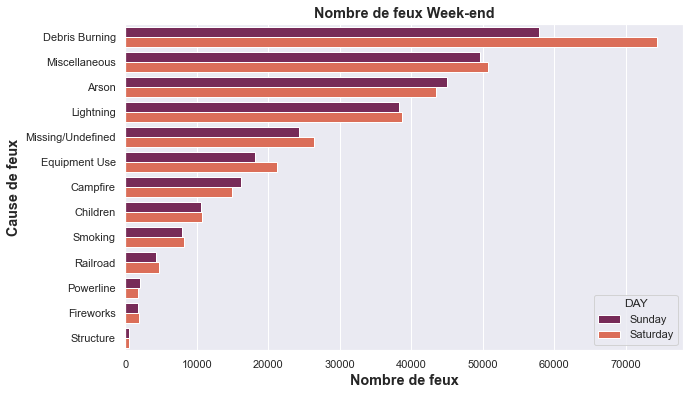

In [46]:
# Création d'un graphique en barre pour connaitre la cause de feux dans le week-end 
fires_weekend = fires[(fires['DAY']=='Saturday') | (fires['DAY']=='Sunday')]

sns.set({"figure.figsize":(10, 6)})
sns.countplot(y='STAT_CAUSE_DESCR', data = fires_weekend, hue= 'DAY', palette='rocket', order= fires_weekend['STAT_CAUSE_DESCR'].value_counts().index);
plt.xlabel('Nombre de feux', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Cause de feux', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux Week-end', fontweight = 'bold', fontsize = 'large');

Comme on imaginait, sur le week-end les feux de forêts sont déclenchés par des personnes négligentes. Notamment le Samedi, quand les gens sont plus susceptibles de sortir ce jour.

Par contre entre les jours de la semaine et le week-end, on ne voit pas une écart si significatif. Afin de le vérifier, on va checker la répartion de causes pour chaque jour.

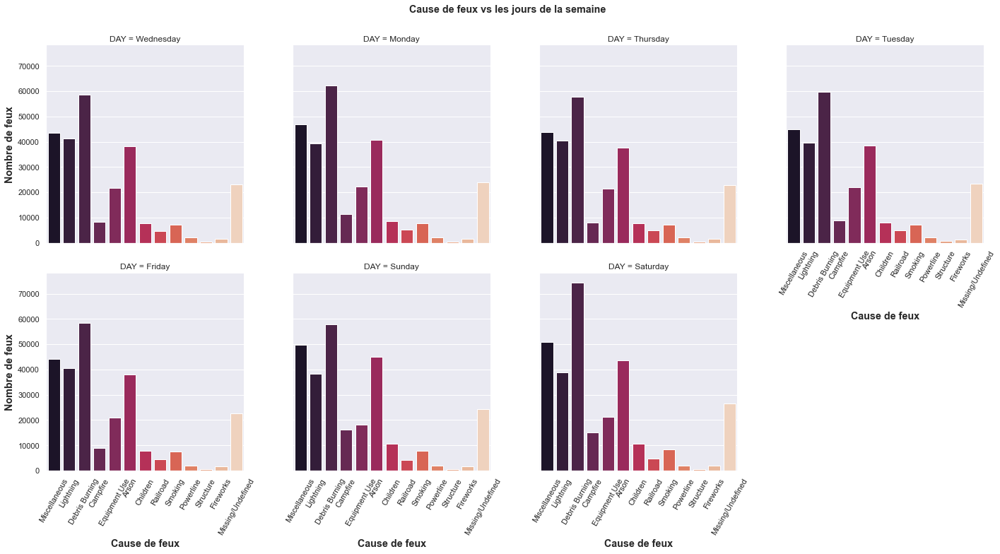

In [47]:
# Création de plusieurs graphiques pour connaitre la cause de feux vs les jours de la semaine
sns.set({"figure.figsize":(14, 12)})
g=sns.catplot(x='STAT_CAUSE_DESCR', col='DAY', kind='count',  palette = 'rocket', col_wrap=4, data = fires);
g.set_xticklabels(rotation=60); 

g.set_xlabels('Cause de feux', fontweight = 'bold', fontsize = 'large')
g.set_ylabels('Nombre de feux', fontweight = 'bold', fontsize = 'large')
g.fig.subplots_adjust(top=0.9) # adjust the Figure in g
g.fig.suptitle('Cause de feux vs les jours de la semaine', fontweight = 'bold', fontsize = 'large');


Même si sur le week-end on a plus d'incidence de feux (Debris Burning / Arson / Miscellaneous), les raisons des feux suivent la même tendance.

Ainsi, le week-end a un effet de croissance sur les causes d'incendies plus récurrents.

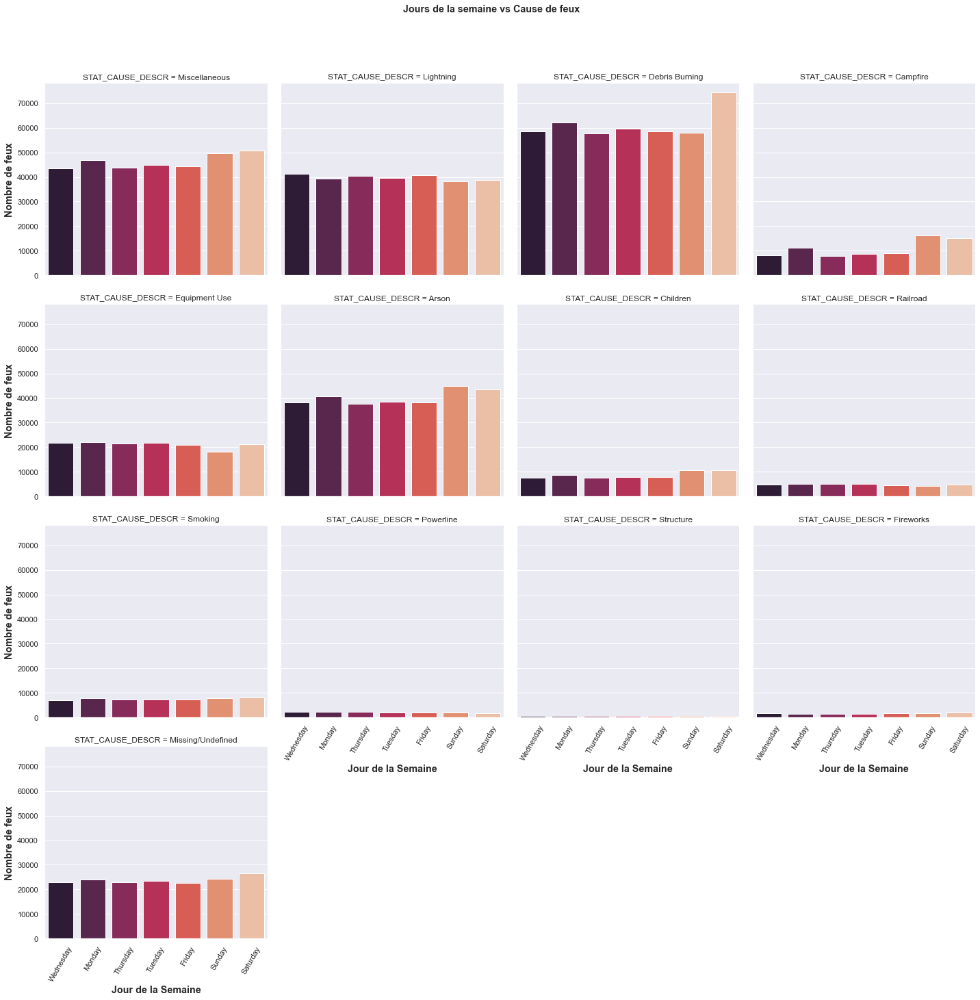

In [48]:
# Création de plusieurs graphiques pour voir les jours de la semaine vs la cause de feux

g=sns.catplot(x='DAY', col='STAT_CAUSE_DESCR', kind='count',  palette = 'rocket', col_wrap=4, data = fires);
g.set_xticklabels(rotation=60); 

g.set_xlabels('Jour de la Semaine', fontweight = 'bold', fontsize = 'large');
g.set_ylabels('Nombre de feux', fontweight = 'bold', fontsize = 'large');
g.fig.subplots_adjust(top=0.9) # adjust the Figure in g
g.fig.suptitle('Jours de la semaine vs Cause de feux', fontweight = 'bold', fontsize = 'large');

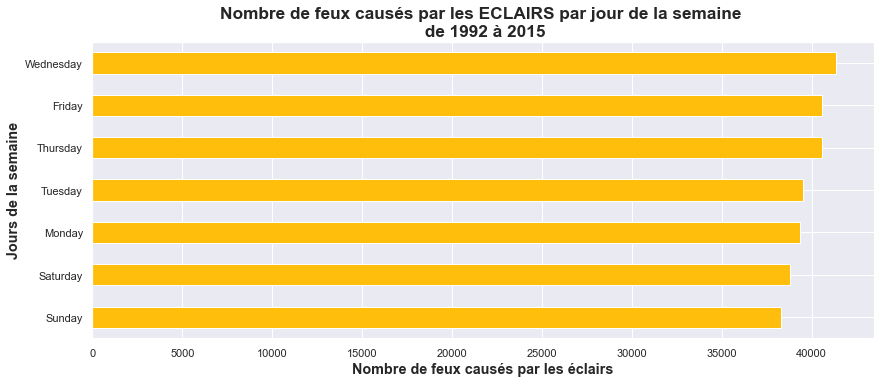

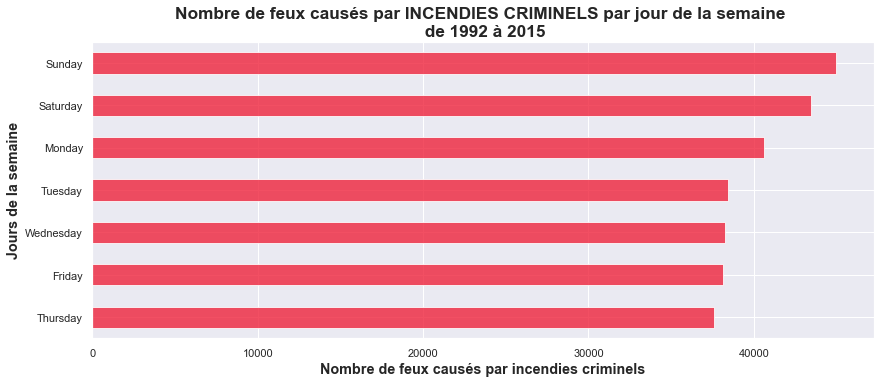

In [49]:
# Création d'un graphique en barre pour connaitre le nombre de de feux déclenchés par les éclairs par jour de la semaine de 1992 à 2015

plt.subplot(211)
fires_lightning = fires[fires['STAT_CAUSE_DESCR']=='Lightning']
fires_lightning['DAY'].value_counts().sort_values().plot(kind='barh',color='#FFBE0B')
plt.xlabel('Nombre de feux causés par les éclairs', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Jours de la semaine', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux causés par les ECLAIRS par jour de la semaine \n de 1992 à 2015', fontsize = 'x-large', fontweight = 'bold')
plt.show()

# Création d'un graphique en barre pour connaitre le nombre de de feux déclenchés par incendies criminels par jour de la semaine de 1992 à 2015
plt.subplot(212)
fires_arson = fires[fires['STAT_CAUSE_DESCR']=='Arson']
fires_arson['DAY'].value_counts().sort_values().plot(kind='barh',color='#EF233C', alpha = 0.8)
plt.xlabel('Nombre de feux causés par incendies criminels', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Jours de la semaine', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux causés par INCENDIES CRIMINELS par jour de la semaine \n de 1992 à 2015', fontsize = 'x-large', fontweight = 'bold')
plt.show()

ECLAIRS

Il y a de très légères variations, mais nous voyons que les feux causés par les éclairs se déclenchent moins le week-end.  
Nous pouvons examiner si l'augmentation des feux de forêt le week-end est due à des incendies malveillants.


INCENDIES CRIMINELS

Cela montre une tendance plus significative.  
Les incendies criminels sont plus probables le week-end que pendant la semaine, cela représente une augmentation d'environ 30 % de la moyenne des jours de la semaine. 

##### Relation états vs nombre d'incendies

Quels États ont le plus d'incendies ? (pour éviter un trop grand nombre de données, nous pouvons nous concentrer sur les dix premiers)

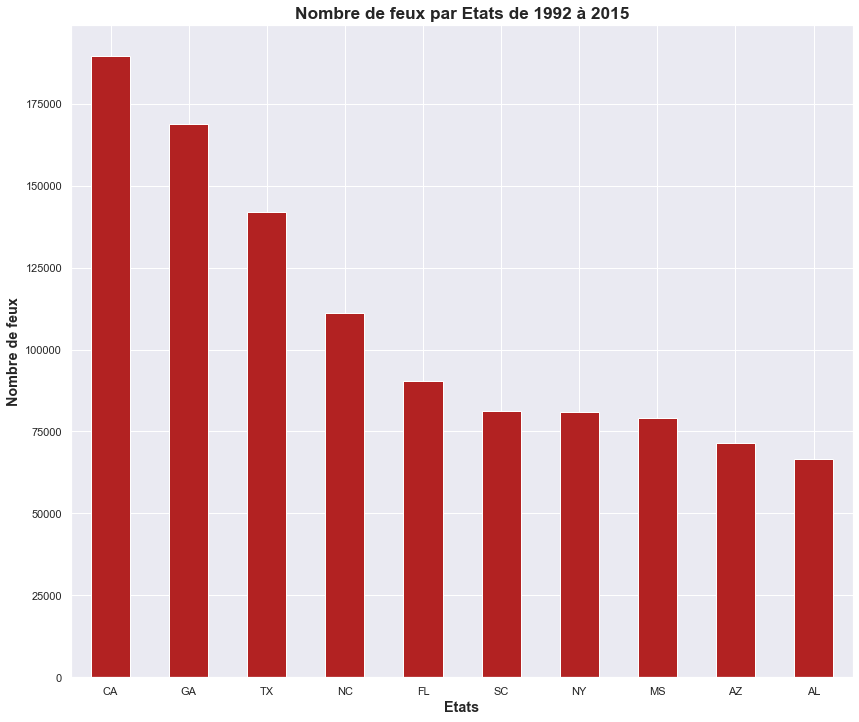

In [50]:
# Création d'un graphique en barre pour connaitre le nombre de de feux déclenchés par Etats de 1992 à 2015
fires['STATE'].value_counts().sort_values(ascending = False).head(10).plot(kind='bar',color='firebrick')
plt.xlabel('Etats', fontweight = 'bold', fontsize = 'large')
plt.xticks(rotation = 'horizontal')
plt.ylabel('Nombre de feux', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux par Etats de 1992 à 2015', fontsize = 'x-large', fontweight = 'bold')
plt.show()


Les 6 derniers Etats ont relativement le même ordre de grandeur de feux de forêt et la Caroline du Nord reste derrière les 3 premiers Etats.  
Nous pouvons nous concentrer sur les 3 premiers Etats qui sont la Californie, la Georgie et le Texas.

La Californie et le Texas sont de grands états avec des climats secs et subtropicaux. Le Texas a également des zones arides. En revanche, la Géorgie a un climant plutôt méditerranéen et continental. On peut se demander pourquoi cet Etat est en 2ème position.  
Nous pouvons enquêter sur les causes des incendies dans ces 3 états.

In [51]:
# Création des 3 DataFrames pour les 3 Etats
fires_CA = fires[fires['STATE']=='CA']
fires_GA = fires[fires['STATE']=='GA']
fires_TX = fires[fires['STATE']=='TX']

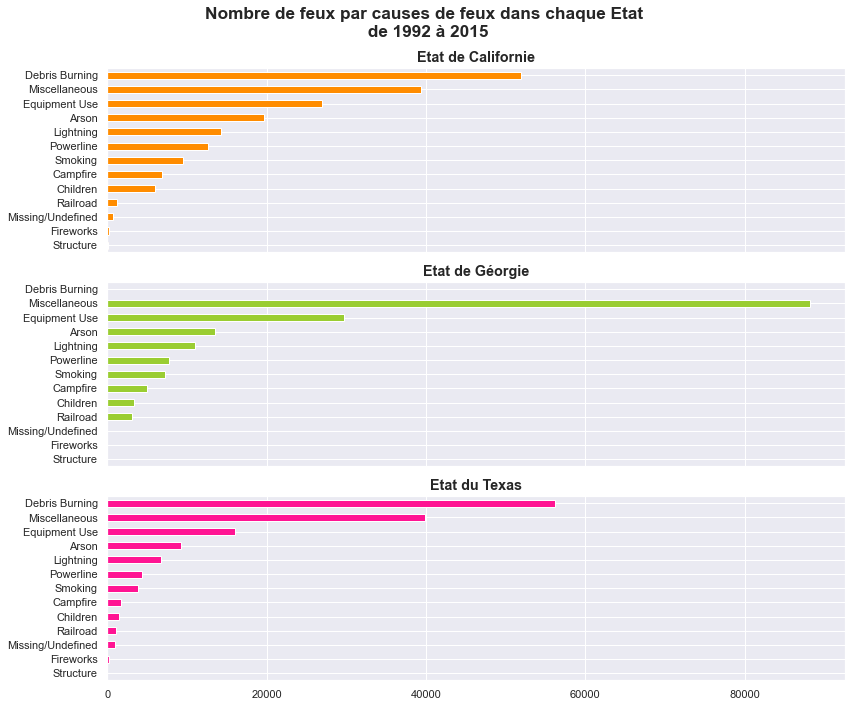

In [52]:
# Création des 3 sous-graphiques pour les 3 Etats
fig, ax = plt.subplots(3,1, figsize = (12, 10))
plt.suptitle('Nombre de feux par causes de feux dans chaque Etat \n de 1992 à 2015', fontsize = 'x-large', fontweight = 'bold')


ax1 = plt.subplot(311) 
fires_CA['STAT_CAUSE_DESCR'].value_counts().sort_values().plot(kind='barh',color='darkorange',title='causes of fires for CA')
plt.title('Etat de Californie', fontsize = 'large', fontweight = 'bold')

ax2 = plt.subplot(312, sharex=ax1, sharey = ax1) 
fires_GA['STAT_CAUSE_DESCR'].value_counts().sort_values().plot(kind='barh',color='yellowgreen',title='causes of fires for CA')
plt.title('Etat de Géorgie', fontsize = 'large', fontweight = 'bold')

ax3 = plt.subplot(313, sharex=ax1, sharey = ax1) 
fires_TX['STAT_CAUSE_DESCR'].value_counts().sort_values().plot(kind='barh',color='deeppink',title='causes of fires for TX')
plt.title('Etat du Texas', fontsize = 'large', fontweight = 'bold')

fig.tight_layout()
plt.show()

Nous voyons que pour les Etats de Californie et du Texas l'ordre des causes est la même et le nombre de feux est sensiblement du même ordre de grandeur.  
Pour l'Etat de Géorgie c'est différent. La première cause d'incendie dépasse de près de 50% celle des 2 autres Etats et fait partie de la catégorie divers. Autrement dit, le nombre de feux n'est ni lié à des causes naturelles ni à des incendies criminels répertoriés dans le dataset.

In [53]:
# Création d'un DataFrame avec uniquement les 3 Etats
top_3_state = fires[(fires.STATE == 'CA') | (fires.STATE == 'GA') | (fires.STATE == 'TX')]

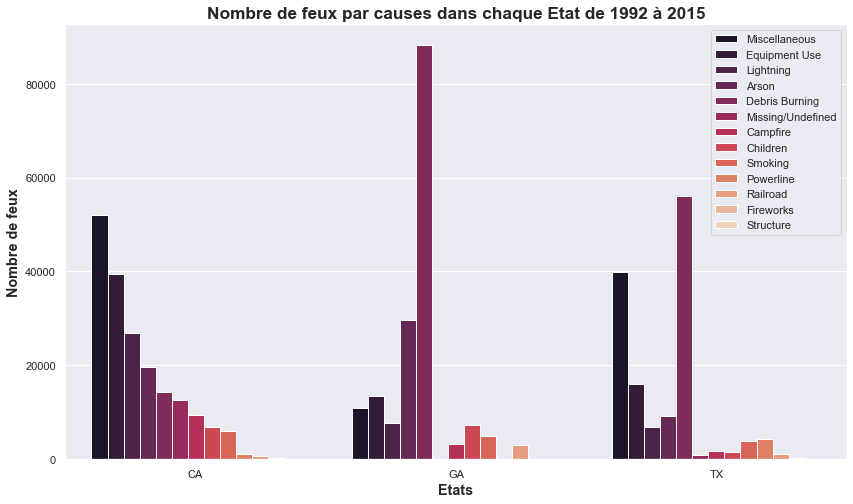

In [54]:
# Création d'un graphique en barre regroupant les 3 Etats dans un seul graphique
groupby_top_3 = top_3_state.groupby(['STATE'], as_index = False)['STAT_CAUSE_DESCR'].value_counts()
sns.set({"figure.figsize":(14, 8)})
sns.barplot(x = 'STATE', y = 'count', hue = 'STAT_CAUSE_DESCR', data = groupby_top_3, palette = 'rocket')
plt.xlabel('Etats', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Nombre de feux', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux par causes dans chaque Etat de 1992 à 2015', fontsize = 'x-large', fontweight = 'bold')
plt.legend(loc = 'best')
plt.show()

Ce graphique nous démontre que les 'débris brûlants' sont la principale cause de feux spécialement dans l'Etat de Géorgie et dans l'Etat du Texas. En revanche, en Californie c'est la cause 'Divers' qui est prédominante.  
Concernant les éclairs, ils se trouvent en 3ème position en Californie puis en 2ème position au Texas.

## Taille de feu

Une autre variable importante à prendre en compte et qui peut nous aider à interpréter les raisons de cause de feux de forêts c'est la classe de taille de feu, précédemment montré sur le camembert.

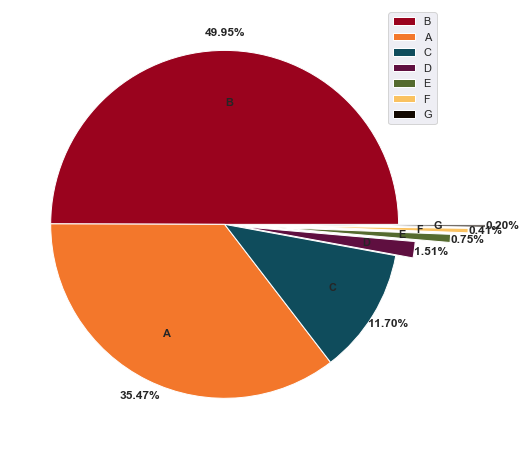

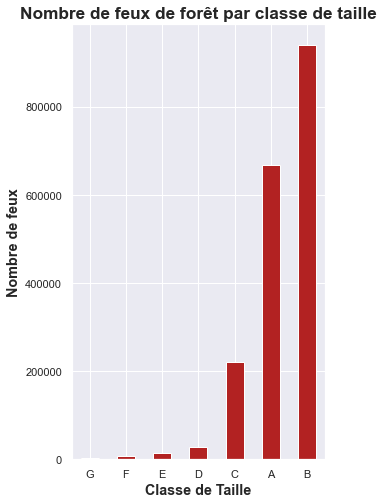

In [55]:
# Création d'un camembert pour analyser la répartition des classes de feux
df_fire_size_class = pd.DataFrame(fires['FIRE_SIZE_CLASS'].value_counts()).reset_index()
df_fire_size_class = df_fire_size_class.rename(columns = {'index' : 'FIRE_SIZE_CLASS', 'FIRE_SIZE_CLASS' : 'Nb'})

fig = plt.figure(figsize=(8,8))
plt.subplot(111)
plt.pie(x = df_fire_size_class.Nb, labels = df_fire_size_class.FIRE_SIZE_CLASS, 
colors = ['#9A031E', '#F3772B', '#0F4C5C', '#5F0F40', '#556B2F', '#FAC261', '#140A01'], 
labeldistance = 0.7, explode = (0,0,0,0.1, 0.3, 0.4, 0.5), autopct = '%.2f%%', pctdistance = 1.1, textprops = dict(weight = 'bold'))
plt.legend()
plt.show()

# Création d'un graphique en barre pour analyser la répartition des classes de feux
fig = plt.figure(figsize=(10,8))
plt.subplot(121)
fires['FIRE_SIZE_CLASS'].value_counts().sort_values(ascending = True).plot(kind='bar',color='firebrick')
plt.xlabel('Classe de Taille', fontweight = 'bold', fontsize = 'large')
plt.xticks(rotation = 'horizontal')
plt.ylabel('Nombre de feux', fontweight = 'bold', fontsize = 'large')
plt.title('Nombre de feux de forêt par classe de taille', fontsize = 'x-large', fontweight = 'bold')
plt.show()

Nous pouvons voir que la classe B qui correspond à une taille de feu comprise entre 0,26 et 9,9 acres (soit entre 10,52 et 400,65 ares) est nettement supérieure aux autres classes, suivie de la plus petite classe (classe A) puis la classe C.

Pour rappel, ci-dessous les tailles de feux :  
A = > 0 et <= 0,25 acre = entre 0 et 10,12 ares  
B = 0,26 à 9,9 acres = entre 10,52 et 400,65 ares  
C = 10,0 à 99,9 acres = entre 405 et 4043 ares

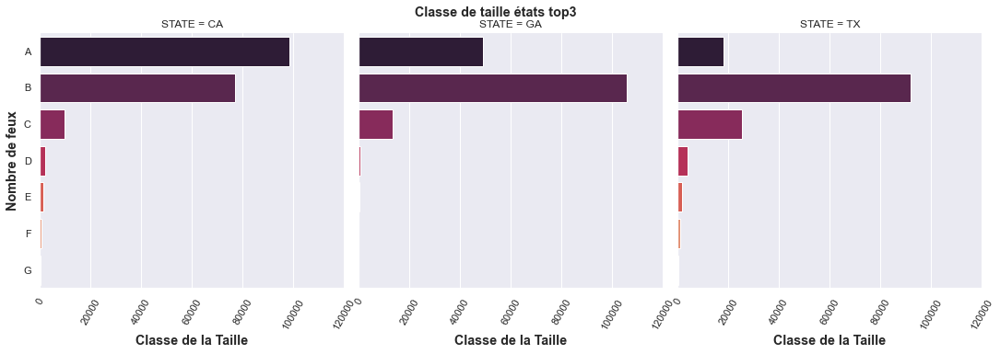

In [56]:
# Création d'un graphique pour vérifier le nombre d'occurrance vs classe de Taille sur les états top 3

groupby_size_state = top_3_state.groupby(['STATE', 'FIRE_SIZE_CLASS'], as_index = False)['STATE'].value_counts()

ax=sns.catplot(x='count', y='FIRE_SIZE_CLASS', col='STATE', kind='bar',  palette = 'rocket', col_wrap=3, data = groupby_size_state);
ax.set_xticklabels(rotation=60); 

ax.set_xlabels('Classe de la Taille', fontweight = 'bold', fontsize = 'large');
ax.set_ylabels('Nombre de feux', fontweight = 'bold', fontsize = 'large');
ax.fig.subplots_adjust(top=0.9);
ax.fig.suptitle('Classe de taille états top3', fontweight = 'bold', fontsize = 'large');

Ce qui est intéressant ici, c'est que la Californie, le top 1 en nombre d'incendies, a aussi le plus grand nombre de petits incendies, on peut donc supposer que l'action humaine est plus forte car 'Debris Burning, Miscellanious, Equipament Use et Arson' sont la principale cause des incendies.

A la Géorgie et au Texas, les feux se propagent dans une zone plus élevée (catégorie B), les raisons restent plutôt également par action humaine, par contre les feux dans ces états se propagent plus rapidement.

A titre d'information 1 acre = 4047 m2, soit 60% d'un terrain de football ou l'équivalent de 16 terrain de tennis.

Donc la grandeur d'un feu de catégorie B n'est pas négligeable.

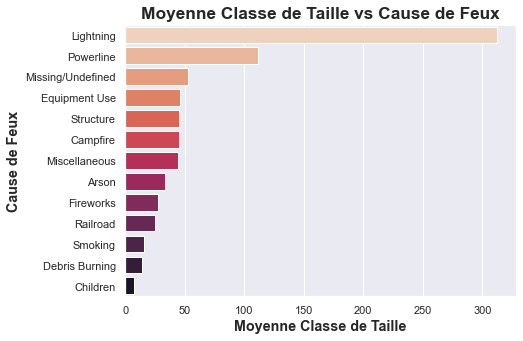

In [57]:
# Création d'un graphique pour vérifier la classe de taille moyenne par Cause 

groupby_size_cause = fires.groupby(['STAT_CAUSE_DESCR'], as_index = False)['FIRE_SIZE'].mean()

sns.set({"figure.figsize":(7, 5)})
sns.barplot(x = 'FIRE_SIZE', y = 'STAT_CAUSE_DESCR', data = groupby_size_cause.sort_values(by='FIRE_SIZE', ascending=False), palette = 'rocket_r')
plt.xlabel('Moyenne Classe de Taille', fontweight = 'bold', fontsize = 'large')
plt.ylabel('Cause de Feux', fontweight = 'bold', fontsize = 'large')
plt.title('Moyenne Classe de Taille vs Cause de Feux', fontsize = 'x-large', fontweight = 'bold')
plt.show()

En moyenne, les feux qui se déclenchent électriquement (naturellement ou par action humaine) sont les plus dangereux et donc susceptibles de se propager.

# Statistiques descriptives

L'objectif c'est de comprendre les variables: Cause, Classe de Taille, Taille au travers d'indicateurs simples.
On va analyser les causes le plus recourrents: Arson, Debris Burning, Lightning, Miscellaneous.

In [58]:
fires_causes_top4 = fires[(fires['STAT_CAUSE_DESCR'] == 'Lightning') | (fires['STAT_CAUSE_DESCR'] == 'Debris Burning') | (fires['STAT_CAUSE_DESCR'] == 'Arson') | (fires['STAT_CAUSE_DESCR'] == 'Miscellaneous')]

In [59]:
groupby_size_stats = fires_causes_top4.groupby(['STAT_CAUSE_DESCR', 'FIRE_SIZE_CLASS']).agg({'FIRE_SIZE' : ['mean','median']})

groupby_size_stats['mean_med_diff'] = groupby_size_stats['FIRE_SIZE']['mean'] - groupby_size_stats['FIRE_SIZE']['median']

In [60]:
groupby_size_stats

FIRE_SIZE           mean_med_diff
                                          mean    median              
STAT_CAUSE_DESCR FIRE_SIZE_CLASS                                      
Arson            A                    0.129772      0.10      0.029772
                 B                    2.467428      2.00      0.467428
                 C                   29.478480     21.00      8.478480
                 D                  162.183735    150.00     12.183735
                 E                  499.161639    450.00     49.161639
                 F                 1966.018873   1621.00    345.018873
                 G                24418.420646  10446.00  13972.420646
Debris Burning   A                    0.126186      0.10      0.026186
                 B                    2.200320      1.33      0.870320
                 C                   26.722275     20.00      6.722275
                 D                  157.333985    150.00      7.333985
                 E                  491.270440    450.00     41.270440
                 F                 1914.621255   1538.95    375.671255
                 G                14400.371304   8284.00   6116.371304
Lightning        A                    0.112512      0.10      0.012512
                 B                    2.027580      1.00      1.027580
                 C                   31.874076     25.00      6.874076
                 D                  168.067111    155.00     13.067111
                 E                  535.019664    500.00     35.019664
                 F                 2262.685956   1988.00    274.685956
                 G                30991.156570  13202.00  17789.156570
Miscellaneous    A                    0.115749      0.10      0.015749
                 B                    1.940235      1.00      0.940235
                 C                   28.798415     20.00      8.798415
                 D                  158.983931    150.00      8.983931
                 E                  508.807041    461.60     47.207041
                 F                 2078.153733   1800.00    278.153733
                 G                21908.464998  10276.50  11631.964998

Rappel : 

Moyenne: Moyenne est la moyenne arithmétique d'une série de chiffres.

Medianne: Médiane est une valeur numérique qui sépare la moitié supérieurs de la moitié inférieure d'un ensemble.


En regardant la difference entre la moyenne et medianne ([mean_med_diff]) on s'apercoit que pour les classe de tailles le plus récurrents (A, B , C et D), la difference n'est pas très significative. C'est un bon indicateur car cela indique l'absence de valeurs extrêmes qui pourraient tirer vers le haut la moyenne. 
Donc en ce qui concerne les classes plus pertinents, les indicateurs nous renseigne sur l'homogénéité des variables dont nous disposons. 

Pour les classes E, F et G on a de moyennes très élévés car c'est logique, de même une considerable difference entre la moyenne et medianne ([mean_med_diff]), en indiquant la présence de valeurs extremes. En géneral, les feux de forêt sur grands superficies sont peu nombreux et cela a une influence directe sur la moyenne.

##### Statistiques - Variables Qualitatives et sa dépendance

On utilise la table de contingence pour croiser les différentes catégories des deux variables: Causes et Classe de Taille.
On va effectuer le test du  χ2  par table de contingence.

Pour ce test, on pose comme hypothèse nulle :
H0  : "les variables STAT_CAUSE_DESCR et FIRE_SIZE_CLASS sont indépendantes"

La fonction chi2_contingency de scipy appliquée à la table de contingence.
Elle renvoie un array de 4 éléments : la statistique du test, la p-value, le degré de liberté et la liste des fréquences attendues. Pour rejeter l'hypothèse nulle, il est nécessaire que la p-value soit inférieure à 5%.

In [61]:
table = pd.crosstab(fires['STAT_CAUSE_DESCR'],fires['FIRE_SIZE_CLASS'])
table

FIRE_SIZE_CLASS,A,B,C,D,E,F,G
STAT_CAUSE_DESCR,,,,,,,
Arson,61919,154181,55913,6239,2276,772,155
Campfire,44215,25911,5002,557,235,133,86
Children,26732,31489,2576,218,100,42,10
Debris Burning,95778,272347,54653,4263,1410,462,115
Equipment Use,53126,73377,16580,2493,1266,571,199
Fireworks,6054,4356,746,176,115,47,6
Lightning,152396,85802,24325,5773,4291,3462,2419
Miscellaneous,134441,152090,29189,4398,2146,1125,416
Missing/Undefined,52868,86781,21269,3012,1662,878,253


In [62]:
from scipy.stats import chi2_contingency 
 
resultats_test = chi2_contingency(table)

statistique = resultats_test[0]
p_value = resultats_test[1]
degre_liberte = resultats_test[2]

print('statistique:',statistique, 'p_value:', p_value, 'degre_liberte:', degre_liberte)

statistique: 175048.45582796063 p_value: 0.0 degre_liberte: 72


# Map visualisation -- Visualisation sur la carte


In [63]:
# Création d'un nouveau DataFrame en supprimant l'Alaska, Hawai et Puerto Rico du jeu de données car ces territoires ne se situent pas dans la carte des Etats_Unis.
fires_usa = fires.loc[(fires.loc[:,'STATE']!='AK') & (fires.loc[:,'STATE']!='HI') & (fires.loc[:,'STATE']!='PR')]
fires_usa_p = pd.DataFrame(fires_usa[['LATITUDE', 'LONGITUDE', 'FIRE_SIZE_CLASS', 'FIRE_SIZE', 'STATE']])

In [64]:
# On encode les classes de taille de feux pour pouvoir les utiliser dans le graphique suivant
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
fires_usa_p['FIRE_SIZE_CLASS'] = le.fit_transform(fires_usa['FIRE_SIZE_CLASS'])

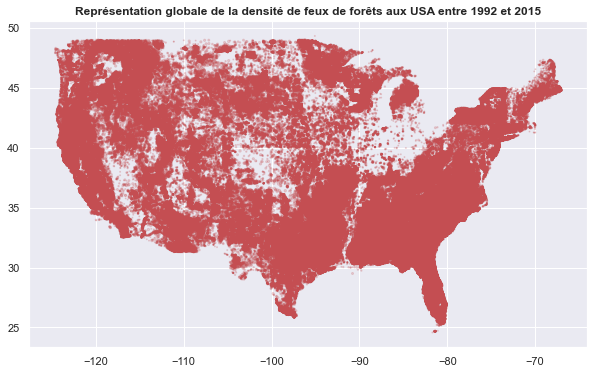

In [65]:
# Représentation graphique des feux de forêts aux USA (on utilise alpha pour distinguer les endroits où la densité des points est importante) :
plt.figure(figsize=(10,6))

plt.scatter(x='LONGITUDE',y='LATITUDE',data=fires_usa_p, alpha=0.2,s=fires_usa_p.FIRE_SIZE_CLASS,label="taille de feu",color='r')
plt.title('Représentation globale de la densité de feux de forêts aux USA entre 1992 et 2015', weight='bold')
plt.show()


A première vue, nous constatons qu'il y a plus de feux là où les états sont les plus peuplés.


Désormais nous allons créer deux cartes : une qui montre le nombre de feux de forêt pour chaque emplacement géographique et une qui montre la taille moyenne des feux de forêt pour chaque emplacement géographique.

In [66]:
# Création du DateFrame pour les 2 cartes
fires_map = pd.DataFrame(fires[['LATITUDE', 'LONGITUDE', 'FIRE_SIZE', 'STATE']])
fires_map

,LATITUDE,LONGITUDE,FIRE_SIZE,STATE
0,40.036944,-121.005833,0.10,CA
1,38.933056,-120.404444,0.25,CA
2,38.984167,-120.735556,0.10,CA
3,38.559167,-119.913333,0.10,CA
4,38.559167,-119.933056,0.10,CA
...,...,...,...,...
1880460,40.481637,-122.389375,0.01,CA
1880461,37.617619,-120.938570,0.20,CA
1880462,37.617619,-120.938570,0.10,CA
1880463,37.672235,-120.898356,2.00,CA


Ensuite, nous supprimons l'Alaska, Hawai et Puerto Rico du jeu de données car ces territoires ne se situent pas dans la carte des Etats_Unis.

In [67]:
fires_map_usa = fires_map.loc[(fires_map.loc[:,'STATE']!='AK') & (fires_map.loc[:,'STATE']!='HI') & (fires_map.loc[:,'STATE']!='PR')]

In [68]:
# Suppression des messages d'avertissement de Pandas qui ne sont pas pertinents
pd.options.mode.chained_assignment = None

Pour une carte cohérente, nous allons regrouper les feux de forêt qui se sont produits à proximité les uns des autres.  
Pour ce faire, nous allons tronquer toutes les valeurs de latitude et de longitude, puis combiner les valeurs dans une nouvelle variable (LAT_LONG).

In [69]:
fires_map_usa.loc[:,'LATITUDE'] = ((fires_map_usa.loc[:,'LATITUDE']*10).apply(np.floor))/10
fires_map_usa.loc[:,'LONGITUDE'] = ((fires_map_usa.loc[:,'LONGITUDE']*10).apply(np.floor))/10
fires_map_usa.loc[:,'LAT_LONG'] = fires_map_usa.loc[:,'LATITUDE'].map(str) + '-' + fires_map_usa.loc[:,'LONGITUDE'].map(str)
group = fires_map_usa.groupby(['LAT_LONG', 'LATITUDE', 'LONGITUDE'])

In [70]:
# Création de la datasource pour la première carte concernant le nombre de feux de forêt par emplacement géographique
nb_fires_map = group['FIRE_SIZE'].agg(['count']).reset_index()
fires_map_usa.head()

,LATITUDE,LONGITUDE,FIRE_SIZE,STATE,LAT_LONG
0,40.0,-121.1,0.10,CA,40.0--121.1
1,38.9,-120.5,0.25,CA,38.9--120.5
2,38.9,-120.8,0.10,CA,38.9--120.8
3,38.5,-120.0,0.10,CA,38.5--120.0
4,38.5,-120.0,0.10,CA,38.5--120.0


In [71]:
# Création de la datasource pour la seconde carte concernant la taille moyenne des feux de forêt par emplacement géographique
size_fires_map = group['FIRE_SIZE'].agg(['mean']).reset_index()
size_fires_map.head()

,LAT_LONG,LATITUDE,LONGITUDE,mean
0,24.5--81.7,24.5,-81.7,0.500000
1,24.6--81.3,24.6,-81.3,0.100000
2,24.6--81.4,24.6,-81.4,0.501630
3,24.6--81.5,24.6,-81.5,0.646512
4,24.6--81.6,24.6,-81.6,0.954545


In [72]:
# Création de la première carte
source = ColumnDataSource(nb_fires_map)
p1 = figure(title='Nombre de feux de forêt de 1992 à 2015 (plus les couleurs sont claires, plus il y a de feux)', toolbar_location=None, plot_width=700, plot_height=500)
p1.background_fill_color = 'black'
p1.grid.grid_line_color = None
p1.axis.visible = False
color_mapper = LogColorMapper(palette=cc.fire)
glyph = p1.circle('LONGITUDE', 'LATITUDE', source=source, color={'field': 'count', 'transform' : color_mapper}, size=1)
output_notebook()
show(p1)

Loading BokehJS ...

In [73]:
# Création de la seconde carte
source = ColumnDataSource(size_fires_map)
p2 = figure(title='Taille moyenne des feux de forêt survenus de 1992 à 2015 (plus les couleurs sont claires, plus le feux est grand)', toolbar_location=None, plot_width=700, plot_height=500)
p2.background_fill_color = 'black'
p2.grid.grid_line_color = None
p2.axis.visible = False
glyph = p2.circle('LONGITUDE', 'LATITUDE', source=source, color={'field': 'mean', 'transform' : color_mapper}, size=1)
show(p2)

D'après ces 2 cartes, nous voyons qu'il y a plus de feux de forêt dans les zones où il y a beaucoup plus de population. Donc on peut garder l'hypothèse qu'il y a plus de feux engendrés par des personnes que par des causes naturelles.  
De plus, ces feux de forêt sont plus petits, probablement parce qu'ils sont plus rapidement maîtrisées du fait de la proximité des pompiers.

Désormais, nous pouvons nous intéresser aux différentes tailles de feux sur les années de 1992 à 2015.  
Par exemple, nous pouvons prendre les plus petites et les plus grosses tailles de feux afin de les comparer sur la carte des USA. Puis nous pouvons également nous intéresser aux tailles de feux les plus répandues, celles qui appartiennent à la classe B.

En regardant les plus petites tailles de feux ainsi que les tailles de feux les plus répandues, il s'avère que le schéma est répétitif d'une année sur l'autre : le nombre de feux selon les états restent sensiblement identique sur toute la période. Le graphique montre des tâches rouges indiscernables les unes sur les autres. Il n'y a pas d'intérêt à montrer ces graphiques.

### Classes de feux les plus grandes (classe G)

Cf. Notebook nommé Graph_classe_G

Intéressons-nous aux feux de forêts durant l'année la plus récente du dataset, c'est à dire l'année 2015.  
Pour un visuel plus attractif, nous pouvons afficher une carte animée qui met en évidence l'évolution des feux : cf. Notebook nommé Animated_map.  

Dans ce notebook, nous verrons également l'évolution des feux lors du 4 juillet de chaque année.

# MODELISATION

## Data cleaning

In [74]:
import warnings
warnings.filterwarnings('ignore')

In [75]:
# Création d'un dataframe pour la modélisation. On enlève à notre dataset de départ (fires) les variables qu'on juge inutiles pour n'importe quelle modélisation. 
fires_model = fires
print(fires_model.info())

# Vérification des données nulles
print(fires_model.isna().sum())


# Nous supprimons les ID, les colonnes avec beaucoup de valeurs manquantes, les colonnes DIFF_YEAR, CONT_DATE_COR et FIRE_SIZE_CLASS_TEST qui ont été créées pour vérifier 
# la conformité des données. Nous supprimons également les colonnes inutiles.
# Nous allons conserver les variables suivantes :
fires_model = fires[['STAT_CAUSE_DESCR','FIRE_SIZE_CLASS', 'STATE', 'MONTH', 'DAY', 'FIRE_YEAR', 'DISCOVERY_DAY', 'LATITUDE', 'LONGITUDE', 'FIRE_SIZE', 'SPLIT_MONTH', 
'SPLIT_DAY', 'DURATION']]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1880465 entries, 0 to 1880464
Data columns (total 48 columns):
 #   Column                      Dtype          
---  ------                      -----          
 0   OBJECTID                    int64          
 1   FOD_ID                      int64          
 2   FPA_ID                      object         
 3   SOURCE_SYSTEM_TYPE          object         
 4   SOURCE_SYSTEM               object         
 5   NWCG_REPORTING_AGENCY       object         
 6   NWCG_REPORTING_UNIT_ID      object         
 7   NWCG_REPORTING_UNIT_NAME    object         
 8   SOURCE_REPORTING_UNIT       object         
 9   SOURCE_REPORTING_UNIT_NAME  object         
 10  LOCAL_FIRE_REPORT_ID        object         
 11  LOCAL_INCIDENT_ID           object         
 12  FIRE_CODE                   object         
 13  FIRE_NAME                   object         
 14  ICS_209_INCIDENT_NUMBER     object         
 15  ICS_209_NAME                object         
 16  

In [76]:
fires_model.head()

,STAT_CAUSE_DESCR,FIRE_SIZE_CLASS,STATE,MONTH,DAY,FIRE_YEAR,DISCOVERY_DAY,LATITUDE,LONGITUDE,FIRE_SIZE,SPLIT_MONTH,SPLIT_DAY,DURATION
0,Miscellaneous,A,CA,February,Wednesday,2005,33,40.036944,-121.005833,0.10,2,2,0 days
1,Lightning,A,CA,May,Wednesday,2004,133,38.933056,-120.404444,0.25,5,12,0 days
2,Debris Burning,A,CA,May,Monday,2004,152,38.984167,-120.735556,0.10,5,31,0 days
3,Lightning,A,CA,June,Monday,2004,180,38.559167,-119.913333,0.10,6,28,5 days
4,Lightning,A,CA,June,Monday,2004,180,38.559167,-119.933056,0.10,6,28,5 days


Pour les autres valeurs NaN, on va uniquement supprimer les données nulles et conserver la variable. Il s'agit essentiellement des variables de temporalité.  
Il n'y a pas d'intérêt à remplacer les valeurs par la moyenne ou le mode pour ce genre de données car cela n'aurait pas de sens, puis il y a trop de valeurs manquantes pour pouvoir les remplcer. Cela fausserait le jeu de données.

In [77]:
# Vérification des NaN
print(fires_model.isna().sum())

#Dimension du dataframe avant suppression des NaN
fires_model.shape  #(1880465, 13)

STAT_CAUSE_DESCR         0
FIRE_SIZE_CLASS          0
STATE                    0
MONTH                    0
DAY                      0
FIRE_YEAR                0
DISCOVERY_DAY            0
LATITUDE                 0
LONGITUDE                0
FIRE_SIZE                0
SPLIT_MONTH              0
SPLIT_DAY                0
DURATION            891531
dtype: int64


(1880465, 13)

In [78]:
# Suppression des NaN
fires_model = fires_model.dropna()

# Dimension du dataframe après suppression des NaN
print(f'La nouvelle dimension du dataframe est : {fires_model.shape}')

La nouvelle dimension du dataframe est : (988934, 13)


In [79]:
# Nous pouvons convertir la durée des feux en donnée numérique pour pouvoir éventuellement l'utiliser dans un modèle
fires_model['DURATION'] = fires_model['DURATION'].dt.days
fires_model['DURATION'].value_counts()

0      806199
1      104954
2       24476
3       11641
4        6772
        ...  
248         1
332         1
240         1
290         1
397         1
Name: DURATION, Length: 314, dtype: int64

In [80]:
# Analyse du type de données afin de séparer les variables numériques et catégorielles
#fires_model.info()
fires_model.nunique()

STAT_CAUSE_DESCR        13
FIRE_SIZE_CLASS          7
STATE                   52
MONTH                   12
DAY                      7
FIRE_YEAR               24
DISCOVERY_DAY          366
LATITUDE            486735
LONGITUDE           558319
FIRE_SIZE            11976
SPLIT_MONTH             12
SPLIT_DAY               31
DURATION               314
dtype: int64

In [81]:
# Variables catégorielles
cat_var = fires_model.select_dtypes(include=[object])
print(cat_var.shape)

# Variables numériques
num_var = fires_model.select_dtypes(include=[np.number])
print(num_var.shape)

# Vérification de la non perte de données
print(fires_model.shape)
print('Les dimensions sont conformes, aucune perte de données')

(988934, 5)
(988934, 8)
(988934, 13)
Les dimensions sont conformes, aucune perte de données


## Variables catégorielles

In [82]:
# Etude des variables catégorielles
cat_var.nunique()

STAT_CAUSE_DESCR    13
FIRE_SIZE_CLASS      7
STATE               52
MONTH               12
DAY                  7
dtype: int64

Il convient de les remplacer par des données numériques pour pouvoir les exploiter.

In [83]:
# Affichage du DataFrame
cat_var

,STAT_CAUSE_DESCR,FIRE_SIZE_CLASS,STATE,MONTH,DAY
0,Miscellaneous,A,CA,February,Wednesday
1,Lightning,A,CA,May,Wednesday
2,Debris Burning,A,CA,May,Monday
3,Lightning,A,CA,June,Monday
4,Lightning,A,CA,June,Monday
...,...,...,...,...,...
1880456,Missing/Undefined,B,CA,June,Sunday
1880457,Arson,B,CA,September,Wednesday
1880458,Lightning,B,CA,August,Saturday
1880459,Miscellaneous,B,CA,May,Thursday


In [84]:
# Regroupement de la variable catégorielle STAT_CAUSE_DESCR par type de cause et remplacement numérique

def change_cause(cat):
    cause = 0
    natural_cause = ['Lightning']
    accidental_cause = ['Structure','Fireworks','Powerline','Railroad','Smoking','Children','Campfire','Equipment Use','Debris Burning']
    criminal_cause = ['Arson']
    other_cause = ['Missing/Undefined','Miscellaneous']
    if cat in natural_cause:
        cause = 1
    elif cat in accidental_cause:
        cause = 2
    elif cat in criminal_cause:
        cause = 3
    else:
        cause = 4
    return cause
     

cat_var['CAUSE'] = cat_var['STAT_CAUSE_DESCR'].apply(lambda x: change_cause(x))
cat_var = cat_var.drop('STAT_CAUSE_DESCR',axis=1)
cat_var.head()

,FIRE_SIZE_CLASS,STATE,MONTH,DAY,CAUSE
0,A,CA,February,Wednesday,4
1,A,CA,May,Wednesday,1
2,A,CA,May,Monday,2
3,A,CA,June,Monday,1
4,A,CA,June,Monday,1


In [85]:
# Regroupement de la variable catégorielle MONTH par saison et remplacement numérique

def season(cat):
    season = 0
    spring = ['March', 'April', 'May']
    summer = ['June','July','August']
    autumn = ['September', 'October', 'November']
    winter = ['December','January', 'February']
    if cat in spring:
        season = 1
    elif cat in summer:
        season = 2
    elif cat in autumn:
        season = 3
    else:
        season = 4
    return season
     

cat_var['SEASON'] = cat_var['MONTH'].apply(lambda x: season(x))
cat_var = cat_var.drop('MONTH',axis=1)
cat_var.head()

,FIRE_SIZE_CLASS,STATE,DAY,CAUSE,SEASON
0,A,CA,Wednesday,4,4
1,A,CA,Wednesday,1,1
2,A,CA,Monday,2,1
3,A,CA,Monday,1,2
4,A,CA,Monday,1,2


In [86]:
# Encodage de la variable catégorielle FIRE_SIZE_CLASS
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
cat_var['FIRE_SIZE_CLASS'] = le.fit_transform(cat_var['FIRE_SIZE_CLASS'])
cat_var['FIRE_SIZE_CLASS'].value_counts()

1    429692
0    421865
2    103618
3     15720
4      9016
5      5802
6      3221
Name: FIRE_SIZE_CLASS, dtype: int64

In [87]:
# Suppression des états Alaska, Hawai et Puerto Rico pour avoir une care des USA
# Encodage de la variable catégorielle STATE => utilisation de LabelEncoder (les états seront triés par ordre alphabétique lors de l'encodage)
cat_var = cat_var.loc[(cat_var.loc[:,'STATE']!='AK') & (cat_var.loc[:,'STATE']!='HI') & (cat_var.loc[:,'STATE']!='PR')]
cat_var['STATE'] = le.fit_transform(cat_var['STATE'])
cat_var['STATE'].value_counts().head()

9     99240
3     91908
32    68949
2     66355
35    60751
Name: STATE, dtype: int64

In [88]:
# Encodage de la variable catégorielle DAY => utilisation de LabelEncoder (les jours seront triés par ordre alphabétique lors de l'encodage)
cat_var['DAY'] = le.fit_transform(cat_var['DAY'])
cat_var['DAY'].value_counts()

2    154833
3    147512
1    141773
0    134808
5    134480
6    134308
4    132121
Name: DAY, dtype: int64

In [89]:
# Reconstitution du DataFrame
fires_model = pd.concat([cat_var, num_var], axis=1)
fires_model

,FIRE_SIZE_CLASS,STATE,DAY,CAUSE,SEASON,FIRE_YEAR,DISCOVERY_DAY,LATITUDE,LONGITUDE,FIRE_SIZE,SPLIT_MONTH,SPLIT_DAY,DURATION
0,0.0,3.0,6.0,4.0,4.0,2005,33,40.036944,-121.005833,0.10,2,2,0
1,0.0,3.0,6.0,1.0,1.0,2004,133,38.933056,-120.404444,0.25,5,12,0
2,0.0,3.0,1.0,2.0,1.0,2004,152,38.984167,-120.735556,0.10,5,31,0
3,0.0,3.0,1.0,1.0,2.0,2004,180,38.559167,-119.913333,0.10,6,28,5
4,0.0,3.0,1.0,1.0,2.0,2004,180,38.559167,-119.933056,0.10,6,28,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1805259,NaN,NaN,NaN,NaN,NaN,2015,175,62.877150,-144.858267,257.60,6,24,27
1805262,NaN,NaN,NaN,NaN,NaN,2015,171,63.966666,-144.576500,604.20,6,20,64
1805263,NaN,NaN,NaN,NaN,NaN,2015,128,63.334027,-142.963583,0.10,5,8,0
1856890,NaN,NaN,NaN,NaN,NaN,2015,171,59.607750,-158.254194,1825.00,6,20,53


##### Verification outliers sur les variables numeriques

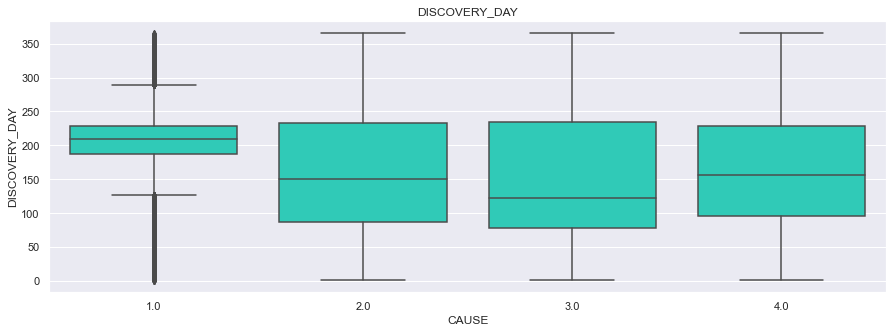

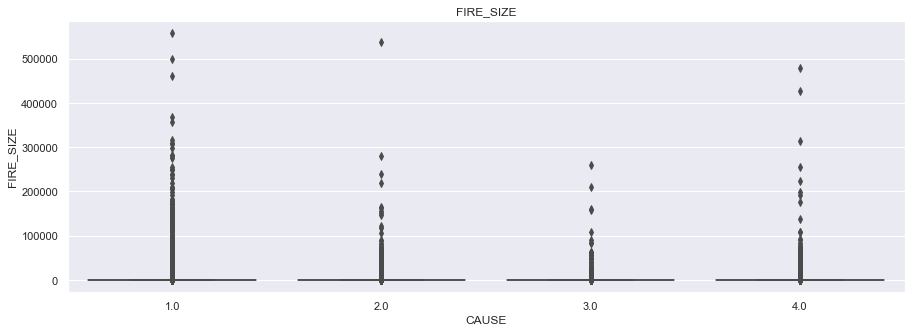

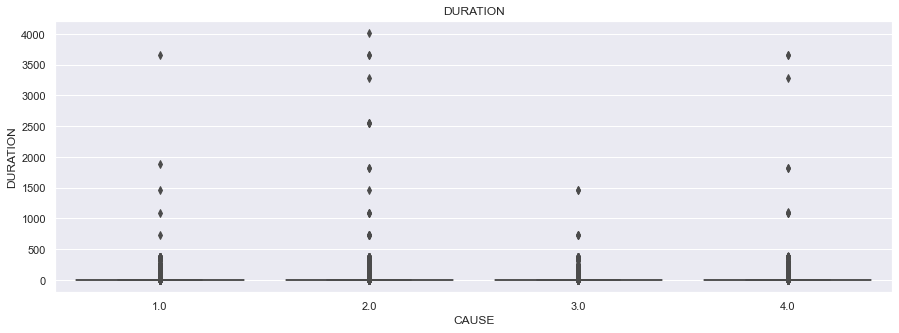

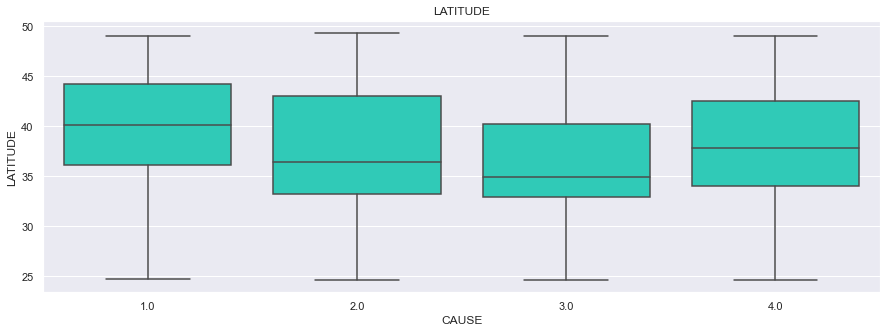

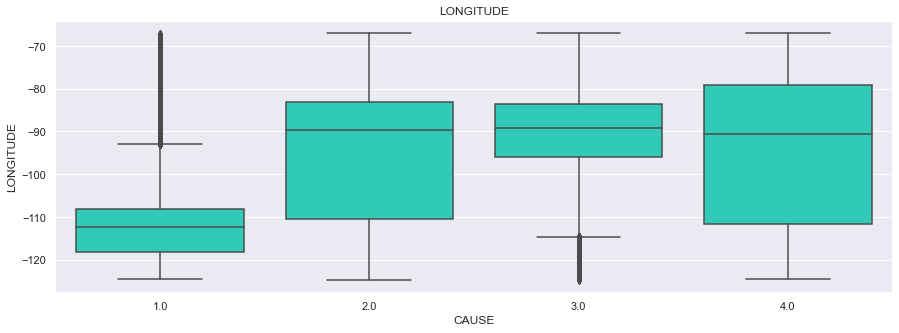

In [90]:
#En statistique, une valeur aberrante (ou outlier en anglais) est une observation qui est "distante" des autres valeurs de la même variable, c'est-à-dire qu'elle contraste grandement avec le reste des valeurs mesurées.
#Une valeur aberrante peut être due à une variabilité inhérente au phénomène observé ou peut aussi indiquer une erreur expérimentale.
#C'est pourquoi elles sont parfois exclues des données.

Col = ['DISCOVERY_DAY', 'FIRE_SIZE', 'DURATION', 'LATITUDE', 'LONGITUDE']

for i in Col:
    fig, axs = plt.subplots(1, 1, figsize=(15, 5))
    sns.boxplot(y=fires_model[i], x=fires_model['CAUSE'], ax=axs, color='#16E4CA')
    plt.title(i)

In [91]:
print('LATITUTE ET LONGITUTE: cela peut varier considerablement, aucun changement ou supression des données')

print('DISCOVERY_DAY: cela reste entre 0 et 365 jours, donc c est cohérent')
print('\n')
print('Par contre on voit des outlier marquants sur DURATION et FIRE_SIZE')
      
print('Quantité outliers DURATION:' , fires_model['DURATION'][fires_model['DURATION']>2500].shape, 'vs', fires_model['DURATION'].shape, 'en total')

print('Quantité outliers FIRE_SIZE:' , fires_model['FIRE_SIZE'][fires_model['FIRE_SIZE']>400000].shape, 'vs', fires_model['FIRE_SIZE'].shape, 'en total')


LATITUTE ET LONGITUTE: cela peut varier considerablement, aucun changement ou supression des données
DISCOVERY_DAY: cela reste entre 0 et 365 jours, donc c est cohérent


Par contre on voit des outlier marquants sur DURATION et FIRE_SIZE
Quantité outliers DURATION: (11,) vs (988934,) en total
Quantité outliers FIRE_SIZE: (13,) vs (988934,) en total


In [92]:
#supression outliers FIRE_SIZE

fires_model = fires_model[fires_model['FIRE_SIZE']<400000]

fires_model.shape

(988921, 13)

In [93]:
# Supression colonne DURATION car cela n'est pas fiable. IL y a beaucoup de valeurs incohérentes
fires_model = fires_model.drop(['DURATION'], axis=1)

In [94]:
fires_model.keys()

Index(['FIRE_SIZE_CLASS', 'STATE', 'DAY', 'CAUSE', 'SEASON', 'FIRE_YEAR',
       'DISCOVERY_DAY', 'LATITUDE', 'LONGITUDE', 'FIRE_SIZE', 'SPLIT_MONTH',
       'SPLIT_DAY'],
      dtype='object')

In [95]:
fires_model = fires_model.dropna()

## Expérimentation des modèles

### PCA

In [96]:
# Import des packages
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

In [97]:
# Séparation des données d'entrainement et des données cibles
data = fires_model.drop(['CAUSE'], axis=1)
target = fires_model['CAUSE']

In [98]:
# Création instance StandardScaler
scaler = StandardScaler()
# Normalisation des données
norm = scaler.fit_transform(data)

# Création de l'instance PCA
model_pca = PCA()

# Stockage de la représentation de data normalisée obtenue par Analyse en Composantes Principales dans un array nommé coord_acp
coord_acp = model_pca.fit_transform(norm)

In [99]:
# Part de variance expliquée pour chaque composante
var_expl = model_pca.explained_variance_
print(var_expl)

[2.33917423e+00 1.48993845e+00 1.19031448e+00 1.07922665e+00
 1.00823763e+00 9.95666630e-01 9.87524259e-01 7.74407224e-01
 7.30073963e-01 4.05430853e-01 1.68605569e-05]


In [100]:
# Dimension de la variance expliquée
var_expl.shape

(11,)

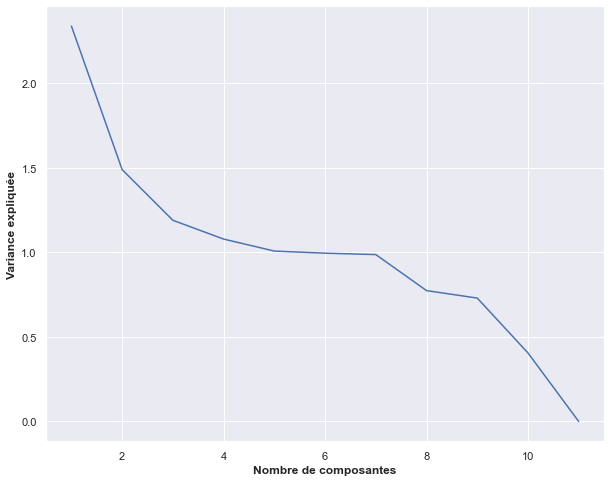

In [101]:
# Graphique de la variance expliquée en fonction du nombre de facteurs
plt.figure(figsize=(10,8))
plt.plot(np.arange(1,12), var_expl)
plt.xlabel('Nombre de composantes', weight='bold') # Nombre de facteurs
plt.ylabel('Variance expliquée', weight='bold') # Valeurs propres
plt.show()

Il existe plusieurs méthodes pour choisir le nombre optimal de composantes à garder.  
Par exemple, la méthode du coude consiste à choisir les valeurs où la courbe précédente s'infléchit.

On remarque ici une cassure à partir de 2 composantes, puis à 3, puis à 4, puis à 5, etc. Nous allons donc faire une ACP sur les 2 premières composantes.

In [102]:
# Ratio de la variance expliquée pour chacune des composantes
ratio_var = model_pca.explained_variance_ratio_ 
ratio_var

array([2.12651985e-01, 1.35448812e-01, 1.08210297e-01, 9.81114132e-02,
       9.16578730e-02, 9.05150558e-02, 8.97748410e-02, 7.04005849e-02,
       6.63702926e-02, 3.68573127e-02, 1.53277633e-06])

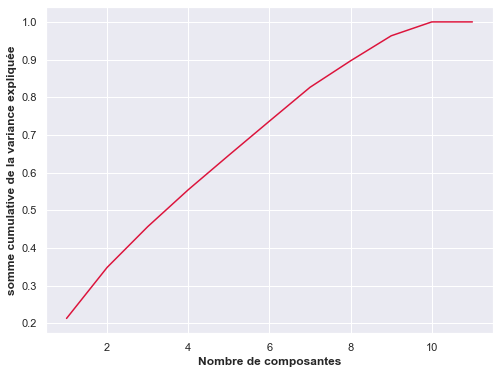

In [103]:
# Graphique de la somme cumulative représentant le ratio de la variance expliquée en fonction du nombre de composantes
plt.figure(figsize=(8,6))

plt.plot(np.arange(1, 12), np.cumsum(ratio_var), color = 'crimson')

plt.xlabel('Nombre de composantes', weight='bold') # Nombre de facteurs
plt.ylabel('somme cumulative de la variance expliquée', weight='bold')

plt.show()

On observe que pour 2 axes, la variance expliquée est d'environ 32%. Pour 6 axes, elle est d'environ 72%.  
Nous pouvons à présent tracer le cercle des corrélations, qui nous permet d'évaluer l'influence de chaque variable pour chaque axe de représentation :

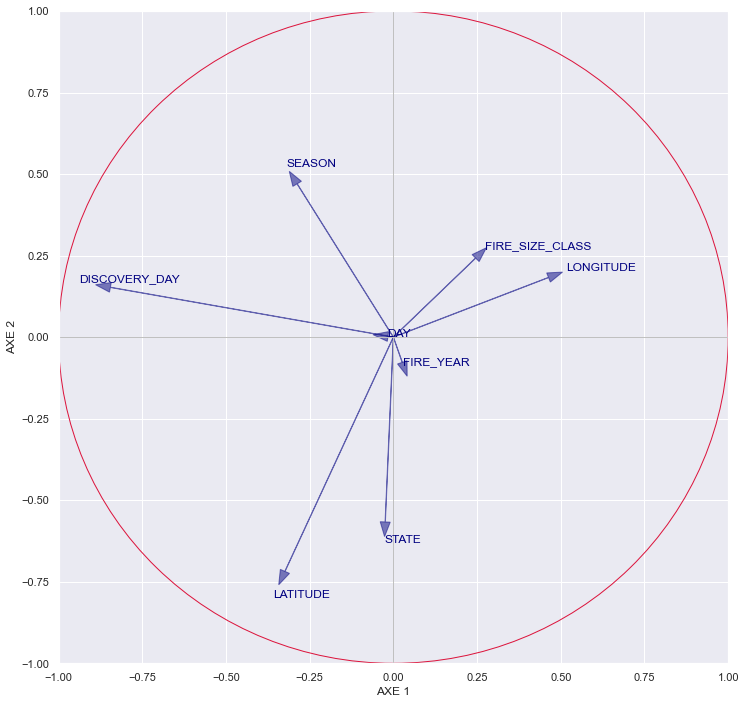

In [104]:
sqrt_eigval = np.sqrt(model_pca.explained_variance_)
corvar = np.zeros((11, 11))
for k in range(11):
    corvar[:, k] = model_pca.components_[k, :] * sqrt_eigval[k]
# corvar

fig, axes = plt.subplots(figsize=(12, 12))
axes.set_xlim(-1, 1)
axes.set_ylim(-1, 1)

# affichage des étiquettes (noms des variables)
for j in range(8):
    plt.annotate(data.columns[j], (corvar[j, 0], corvar[j, 1]), color='navy')
    plt.arrow(0, 0, corvar[j, 0]*0.9, corvar[j, 1]*0.9, alpha=0.5, head_width=0.03, color='navy')

# ajouter les axes
plt.plot([-1, 1], [0, 0], color='silver', linestyle='-', linewidth=1)
plt.plot([0, 0], [-1, 1], color='silver', linestyle='-', linewidth=1)

cercle = plt.Circle((0, 0), 1, color='crimson', fill=False)
axes.add_artist(cercle)
plt.xlabel('AXE 1')
plt.ylabel('AXE 2')
plt.show()

Un cercle de corrélation permet de lire la corrélation de chaque variable avec les axes 1 et 2.  
Si une flèche est courte, cela veut dire que la variable est peu corrélée à l'axe, elle est mal représentée, on a perdu une très grande partie de l'information que contenait cette variable. Il ne faut donc pas l'interpréter.  
Pour les flèches plus longues, si elles sont verticales ou horizontales par rapport aux axes, cela veut dire qu'il existe une très forte corrélation.  
Si la pointe est proche du cercle, la variable est très bien représentée dans le plan défini par les axes 1 et 2.

Dans le cercle des corrélations nous voyons bien que la variable DISCOVERY_DAY est corrélée à l'axe 1. Les variables STATE et LATITUDE sont corrélées à l'axe 2  et la variable STATE est très fortement corrélée à l'axe 2 même si la flèche n'est pas très longue.

In [105]:
# Création d'un dataframe avec uniquement les 2 premières coordonnées de PCA
acp_data = pd.DataFrame({'axe1':coord_acp[:,0], 'axe2':coord_acp[:,1], 'target':target})

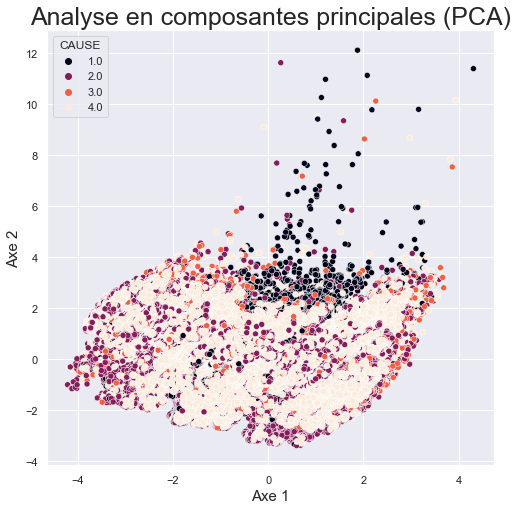

In [106]:
# Représentation graphique du nuage de points
plt.figure(figsize=(8,8))

sns.scatterplot(x='axe1', y='axe2', hue= target, data=acp_data, palette='rocket')

plt.title('Analyse en composantes principales (PCA)', fontsize=25)
plt.xlabel('Axe 1', fontsize=15)
plt.ylabel('Axe 2', fontsize=15)

plt.show()

Nous observons que les points ne sont pas bien répartis et qu'ils sont amassés au même endroit.  
Il n'y a pas clairement de division en groupes distincts.

### T-SNE 

In [107]:
# L'objectif de T-SNE est similaire à celui de l'ACP : représenter nos données dans une dimension plus petite.
# Cependant, le principe de T-SNE est différent :
# Il construit une nouvelle représentation des données de manière à ce que les données proches dans la dimension d'origine aient une forte probabilité d'avoir des représentations proches dans la nouvelle dimension.

from sklearn.manifold import TSNE

In [108]:
# Création de l'instance T-SNE
tsne = TSNE(n_components=2)

# Import de la fonction random pour pouvoir sélectionner aléatoirement 100000 données du dataset normalisé
import random
norm_aleatoire = random.choices(norm, k=100000)

# Stockage de la représentation de data normalisée avec 10% des données intiales afin de ne pas trop bloquer le lancement
# Pour mémoire : time 12 à 24min.
Coord_TSNE = tsne.fit_transform(norm_aleatoire)

In [109]:
# DataFrame tsne_df contenant les coordonnées Coord_TSNE ainsi que la variable target avec 10% des données initiales.

tsne_df = pd.DataFrame({'AXE 1': Coord_TSNE[:, 0], 'AXE 2': Coord_TSNE[:, 1], 'Target': target[:100000]})

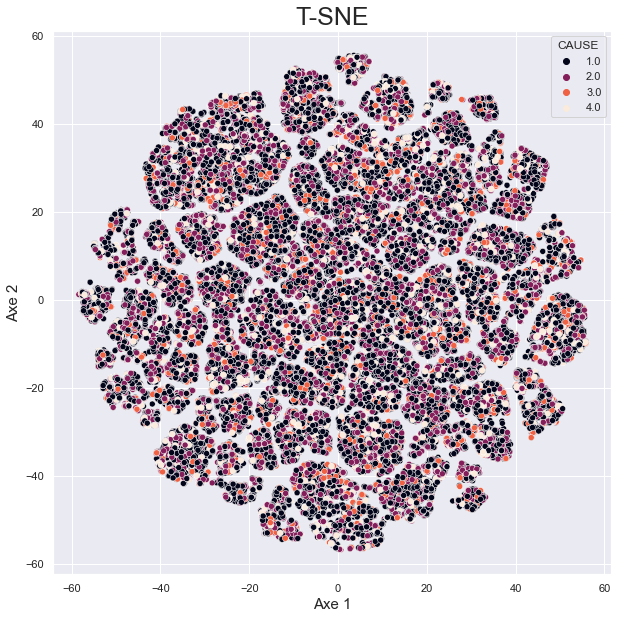

In [110]:
# Représentation graphique de 10% des données

plt.figure(figsize=(10,10))

sns.scatterplot(x='AXE 1', y='AXE 2', hue= target, data=tsne_df, palette='rocket')

plt.title('T-SNE', fontsize=25)
plt.xlabel('Axe 1', fontsize=15)
plt.ylabel('Axe 2', fontsize=15)

plt.show()

Les résultats obtenus avec le T-SNE sont meilleurs que ceux obtenus lors de l'ACP. Néanmoins, les regroupements ne sont pas clairement bien délimités, même si on aperçoit des regroupements avec une couleur prédominante.  
Si l'on souhaite avoir une distinction clairement visible, il est intéressant de se pencher sur une association des deux algorithmes : Une fois les coordonnées de l'ACP calculés, on y applique l'algorithme du T-SNE.

### T-SNE + PCA

In [111]:
# Création d'une nouvelle isntance de TSNE
tsne_new = TSNE(n_components=2)

# Stockage des coordonnées du T-SNE sur celles de l'ACP avec 10% des données
# Pour mémoire : time > 13 min. 
coord_acp_aleatoire = random.choices(coord_acp, k=100000)
Coord_TSNE_ACP = tsne_new.fit_transform(coord_acp_aleatoire)

In [112]:
# Création d'un nouveau DataFrame tsne_acp_df contenant Coord_TSNE_ACP et la variable target
tsne_acp_df = pd.DataFrame({'AXE 1': Coord_TSNE_ACP[:, 0], 'AXE 2': Coord_TSNE_ACP[:, 1], 'Target': target[:100000]})

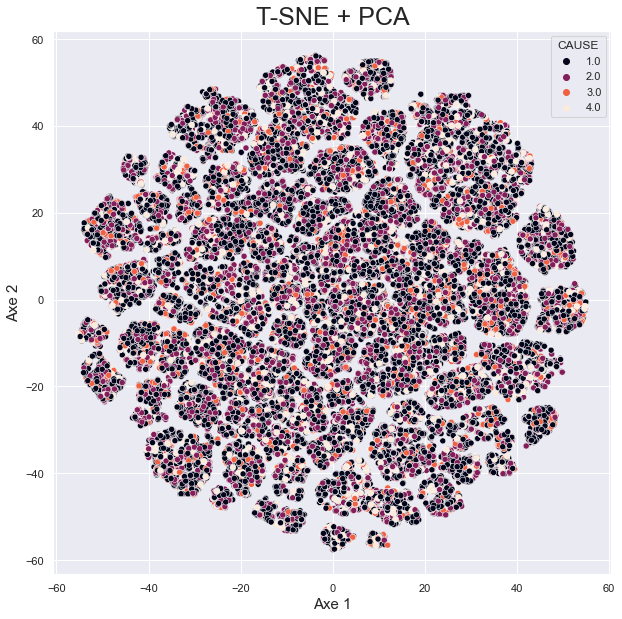

In [113]:
# Représentation graphique
plt.figure(figsize=(10,10))

sns.scatterplot(x='AXE 1', y='AXE 2', hue= target, data=tsne_acp_df, palette='rocket')

plt.title('T-SNE + PCA', fontsize=25)
plt.xlabel('Axe 1', fontsize=15)
plt.ylabel('Axe 2', fontsize=15)

plt.show()

En combinant les algorithmes il n'y a pas vraiment de différence

### KMeans => A REVOIR

L'algorithme des K-means (ou K-moyennes) est une méthode de partitionnement de données.  
Étant donnés un ensemble de points et un entier K, l'algorithme vise à diviser les points en clusters, homogènes et compacts.  
Chaque point de l'ensemble des données se verra attribuer un cluster pour lequel la somme des carrés des distances entre ce point et la moyenne du groupe (le centroïde) sera minimal.

In [114]:
# import
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Conserver uniquement les variables 'LATITUDE' et 'LONGITUDE' normalisées dans un df kmeans et sur les Etats_Unis d'Amérique (hors Alaska, Hawai et Puerto Rico).
fires_model_for_kmeans = fires_model.loc[(fires_model.loc[:,'STATE']!='AK') & (fires_model.loc[:,'STATE']!='HI') & (fires_model.loc[:,'STATE']!='PR')]

fires_model_for_kmeans = fires_model_for_kmeans[['LONGITUDE', 'LATITUDE', 'FIRE_SIZE_CLASS']]

# Standardisation des données
sc = StandardScaler()
fires_model_norm = sc.fit_transform(fires_model_for_kmeans)

In [115]:
fires_model_norm_kmeans = pd.DataFrame(fires_model_norm, columns=['LONGITUDE','LATITUDE','FIRE_SIZE_CLASS'])
fires_model_norm_kmeans

,LONGITUDE,LATITUDE,FIRE_SIZE_CLASS
0,-1.416553,0.328149,-0.875681
1,-1.379275,0.121889,-0.875681
2,-1.399799,0.131439,-0.875681
3,-1.348833,0.052028,-0.875681
4,-1.350056,0.052028,-0.875681
...,...,...,...
979824,-1.502438,0.324966,0.259265
979825,-1.544478,0.431222,0.259265
979826,-1.573894,0.366993,0.259265
979827,-1.519091,0.025204,0.259265


In [116]:
# Création de l'instance KMeans
kmeans = KMeans(n_clusters=2)

# Ajustement 
kmeans.fit(fires_model_norm_kmeans)

# Prédictions
y_kmeans = kmeans.predict(fires_model_norm_kmeans)

In [117]:
# vecteur qui contient le numéro du groupe de chacune des données
labels = kmeans.labels_ 
labels


array([1, 1, 1, ..., 1, 1, 1])

In [118]:
# Coordonnées des clusters / liste des positions des K centroïdes
centroids = kmeans.cluster_centers_
centroids

array([[ 0.80400053, -0.49714756,  0.33923798],
       [-0.87224058,  0.53934328, -0.36803102]])

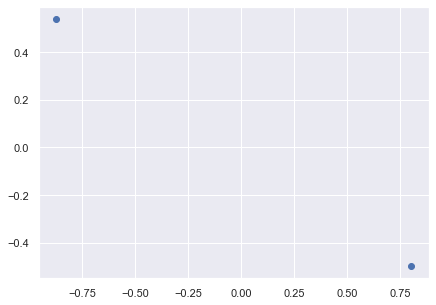

In [119]:
# Graphique des centroïdes
plt.scatter(centroids[:, 0],centroids[:, 1])
plt.show()

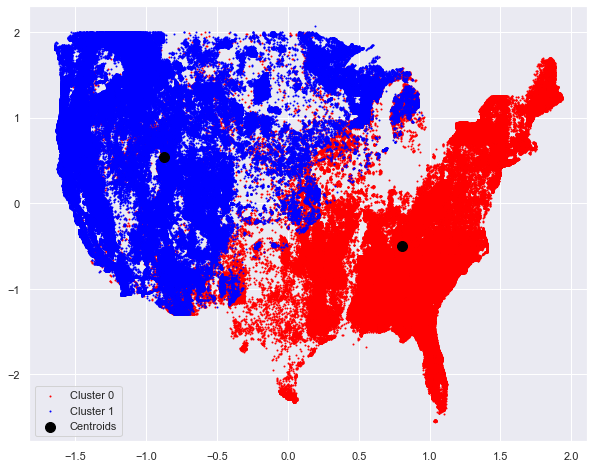

In [120]:
plt.figure(figsize=(10, 8))

plt.scatter(fires_model_norm_kmeans[y_kmeans==0].iloc[:,0], fires_model_norm_kmeans[y_kmeans==0].iloc[:,1],
            s=1, c='red', label='Cluster 0')

plt.scatter(fires_model_norm_kmeans[y_kmeans==1].iloc[:,0], fires_model_norm_kmeans[y_kmeans==1].iloc[:,1],
            s=1, c='blue', label='Cluster 1')


plt.scatter(centroids[:, 0],centroids[:, 1], s=100, c='black', label='Centroids')

plt.legend(loc='best');

### Nombre de k optimal

### n_cluster différent

In [122]:
fires_model_for_kmeans2 = fires_model.loc[(fires_model.loc[:,'STATE']!='AK') & (fires_model.loc[:,'STATE']!='HI') & (fires_model.loc[:,'STATE']!='PR')]
fires_model_for_kmeans2 = fires_model_for_kmeans2[['LONGITUDE', 'LATITUDE','FIRE_SIZE_CLASS', 'SEASON', 'CAUSE']]

# Standardisation des données
sc2 = StandardScaler()
fires_model_norm2 = sc.fit_transform(fires_model_for_kmeans2)

In [123]:
fires_model_norm2_kmeans = pd.DataFrame(fires_model_norm2, columns=(['LONGITUDE', 'LATITUDE','FIRE_SIZE_CLASS', 'SEASON', 'CAUSE']))
fires_model_norm2_kmeans

,LONGITUDE,LATITUDE,FIRE_SIZE_CLASS,SEASON,CAUSE
0,-1.416553,0.328149,-0.875681,1.923923,1.482049
1,-1.379275,0.121889,-0.875681,-1.123420,-1.288671
2,-1.399799,0.131439,-0.875681,-1.123420,-0.365098
3,-1.348833,0.052028,-0.875681,-0.107639,-1.288671
4,-1.350056,0.052028,-0.875681,-0.107639,-1.288671
...,...,...,...,...,...
979824,-1.502438,0.324966,0.259265,-0.107639,1.482049
979825,-1.544478,0.431222,0.259265,0.908142,0.558476
979826,-1.573894,0.366993,0.259265,-0.107639,-1.288671
979827,-1.519091,0.025204,0.259265,-1.123420,1.482049


In [124]:
# Création d'une instance kmeans avec le nombre de clusters optimal
kmeans2 = KMeans(n_clusters=4)

# Ajustement
kmeans2.fit(fires_model_norm2_kmeans)

# Prédictions
y_kmeans2 = kmeans2.fit_predict(fires_model_norm2_kmeans)

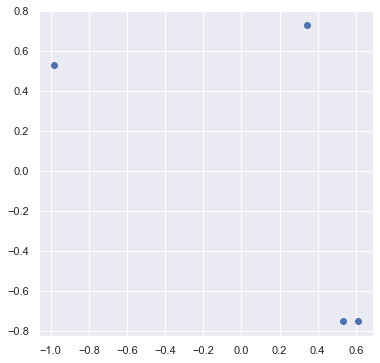

In [125]:
# Représentation des nouveaux centroïds dans un graphique
plt.figure(figsize=(6,6))
plt.scatter(kmeans2.cluster_centers_[:,0], kmeans2.cluster_centers_[:,1])

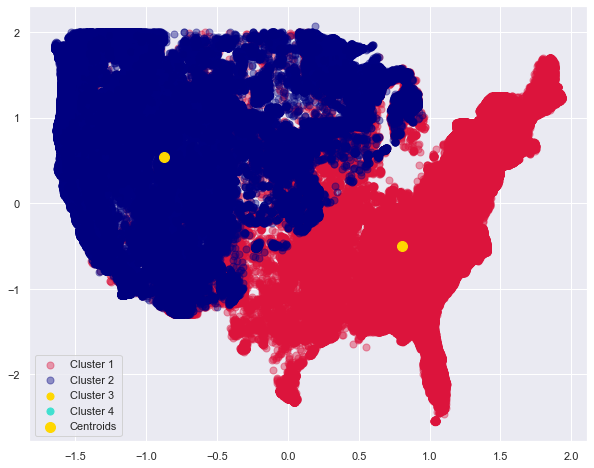

In [135]:
# Représentation graphique

plt.figure(figsize=(10, 8))

plt.scatter(fires_model_norm2_kmeans[y_kmeans==0].iloc[:,0], fires_model_norm2_kmeans[y_kmeans==0].iloc[:,1],
            s=50, c='crimson', label='Cluster 1', alpha=0.4)

plt.scatter(fires_model_norm2_kmeans[y_kmeans==1].iloc[:,0], fires_model_norm2_kmeans[y_kmeans==1].iloc[:,1], 
            s=50, c='navy', label='Cluster 2',alpha=0.4)

plt.scatter(fires_model_norm2_kmeans[y_kmeans==2].iloc[:,0], fires_model_norm2_kmeans[y_kmeans==2].iloc[:,1], 
            s=50, c='gold', label='Cluster 3')

plt.scatter(fires_model_norm2_kmeans[y_kmeans==3].iloc[:,0], fires_model_norm2_kmeans[y_kmeans==3].iloc[:,1],
            s=50, c='turquoise', label='Cluster 4')

plt.scatter(centroids[:, 0],centroids[:, 1], s=100, c='gold', label='Centroids')

plt.legend(loc='best')
plt.show()

# Prédiction des causes de feux de forêts

In [127]:
# Import du module
from sklearn import tree, preprocessing
import sklearn.ensemble as ske
from sklearn.model_selection import train_test_split

In [128]:
# Séparation du jeu de données
X = fires_model.drop(['CAUSE'], axis=1).values
y = fires_model['CAUSE'].values

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [129]:
# Création du classifieur forêt aléatoire et entrainement du modèle
# Pour mémoire : time > 5 min.

clf_rf = ske.RandomForestClassifier()
clf_rf = clf_rf.fit(X_train, y_train)
print(clf_rf.score(X_test,y_test))

0.7154557423226479


Le score de prédiction est de 0.72% ce qui est relativement un bon score et prouve que le modèle est plus proche du succès que de l'échec.  
Désormais, examinons la matrice de confusion :

In [130]:
# Matrice de confusion
# Pour mémoire : time > 5 min.

from sklearn.metrics import confusion_matrix
y_pred = clf_rf.fit(X_train, y_train).predict(X_test)
cm = confusion_matrix(y_true=y_test,y_pred=y_pred)
print(cm)

[[39309  3640   319  1639]
 [ 5216 57176  5361  7243]
 [  715 10742 14825  3009]
 [ 3151 12772  1940 28909]]


Nous pouvons normaliser cela et visualiser le résultat :

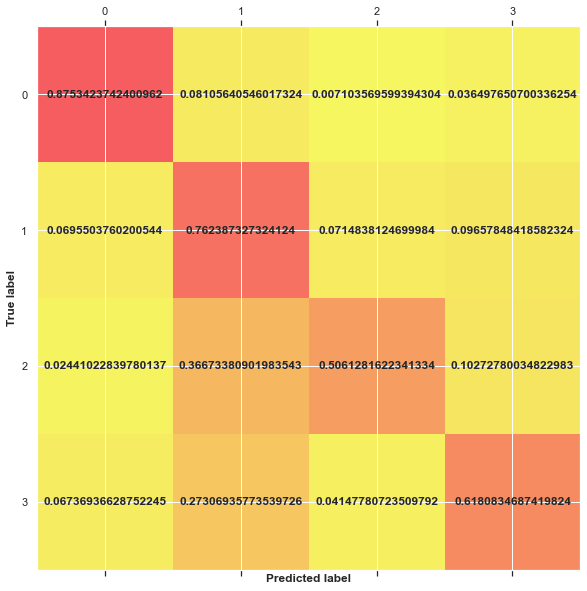

In [131]:
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig,ax = plt.subplots(figsize=(10,10))
ax.matshow(cmn,cmap='autumn_r',alpha=0.6)

for i in range(cmn.shape[0]):
    for j in range(cmn.shape[1]):
        ax.text(x=j,y=i,s=cmn[i,j], weight='bold', va='center',ha='center')

plt.xlabel('Predicted label', weight='bold')
plt.ylabel('True label', weight='bold')

plt.show()

L’algorithme Random Forest a bien fonctionné avec les deux premières étiquettes : natural_cause et accidental_cause (87% et 77%) mais n’a pas fait aussi bien avec l’étiquette other_cause. Concernant l'étiquette criminal_cause, la prédiction n'est pas un succès, il a étiqueté à tort beaucoup d’entre-elles comme accidentelles.
